<a href="https://colab.research.google.com/github/Anaphase21/Probing-language-models-for-syntactic-and-semantic-knowledge-on-African-languages/blob/main/Notebook_for_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install datasets

In [ ]:
from huggingface_hub import hf_hub_download
from datasets import load_dataset
from matplotlib import pyplot as plt
from transformers import AutoTokenizer, XLMRobertaModel, XLMRobertaTokenizer, AutoModel, XLMRobertaForMaskedLM, AutoModelForMaskedLM, AutoModelForTokenClassification, XLMRobertaForMaskedLM
from transformers.modeling_outputs import BaseModelOutputWithPoolingAndCrossAttentions
from datasets.arrow_dataset import Dataset

import seqeval.metrics as seqeval
import sklearn.metrics as sklearn
from seqeval.scheme import IOB2

import h5py

from torch.utils.data import DataLoader
import torch
import torch
import torch.nn as nn
import torch.optim as optim

from math import exp
import os
import yaml


import re
import pandas as pd
import numpy as np
import random
import json

## Download and unzip the github code.

In [ ]:
# Download the github repository
!wget https://github.com/juditacs/probing/archive/refs/heads/main.zip
!unzip main.zip -d probing

--2024-08-23 22:26:51--  https://github.com/juditacs/probing/archive/refs/heads/main.zip
Resolving github.com (github.com)... 140.82.116.4
Connecting to github.com (github.com)|140.82.116.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/juditacs/probing/zip/refs/heads/main [following]
--2024-08-23 22:26:52--  https://codeload.github.com/juditacs/probing/zip/refs/heads/main
Resolving codeload.github.com (codeload.github.com)... 140.82.116.10
Connecting to codeload.github.com (codeload.github.com)|140.82.116.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘main.zip’

main.zip                [ <=>                ] 322.76K  --.-KB/s    in 0.04s   

2024-08-23 22:26:52 (7.15 MB/s) - ‘main.zip’ saved [330510]

Archive:  main.zip
122be08cde82e6dfbca55c354476a708ca806325
   creating: probing/probing-main/
  inflating: probing/probing-main/.gitignore  
  inflating: p

## Install the probing package

In [ ]:
# Install the probing package
%cd /content/probing/probing-main
!pip install .

/content/probing/probing-main
Processing /content/probing/probing-main
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.5/235.5 kB 5.5 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_n

## Reinstall the package
The first installation was incomplete as some files were missing in the lib folder, causing "Importing module error". This is the problem I mentioned last week.

In [ ]:
# The installation does not include all files/directories (data and model subdirectories),
# I will manually copy those files into the lib directory.
# This is the problem I encountered last week.
# !cp -r /content/probing/probing-main/src/probing/models /content/probing/probing-main/build/lib/probing
# !cp -r /content/probing/probing-main/src/probing/data /content/probing/probing-main/build/lib/probing

In [ ]:
# Finally reinstall the package to reflect the changes.
# Install the probing package
%cd /content/probing/probing-main
!pip install .

/content/probing/probing-main
Processing /content/probing/probing-main
  Preparing metadata (setup.py) ... done
  Created wheel for probing: filename=probing-0.0.0-py3-none-any.whl size=33990 sha256=05646ff514006c477f654df5b51c256aa1753dd202c3be4b2a4647b95e60cb5e
  Stored in directory: /root/.cache/pip/wheels/cf/30/9f/770de0a7fd45c32575575e4ce33c0ac53d97c889c6925741b3
Successfully built probing
  Attempting uninstall: probing
    Found existing installation: probing 0.0.0
    Uninstalling probing-0.0.0:
      Successfully uninstalled probing-0.0.0


In [ ]:
!python /content/probing/probing-main/src/probing/train.py \
    --config /content/probing/probing-main/examples/config/pos_tagging.yaml \
    --train-file /content/probing/probing-main/examples/data/pos_tagging/hau/train \
    --dev-file /content/probing/probing-main/examples/data/pos_tagging/hau/dev

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-09-26 19:21:33,760 - INFO - Data loaded
2024-09-26 19:21:33,760 - INFO - Train data size: 753
2024-09-26 19:21:33,760 - INFO - Dev data size: 150
2024-09-26 19:21:33,760 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-09-26 19:21:33,980 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.
2024-09-26 19:21:41,778 - INFO - Number of parameters: 52015
2024-09

In [ ]:
%rm -r /content/test

rm: cannot remove '/content/test': No such file or directory


## Helper functions

In [ ]:
def convert_to_tsv(dataset: Dataset, file_path: str, tags_map):
    os.makedirs(os.path.dirname(file_path), exist_ok=True)
    with open(file_path, 'w', encoding='utf-8') as f:
        for i, example in enumerate(dataset):
            for idx, token in enumerate(example['tokens']):
                line = [
                    #str(idx + 1),
                    str(token),
                    tags_map.get(example['upos'][idx], '_')
                ]
                f.write('\t'.join(line) + '\n')
            f.write('\n')

In [ ]:
def get_word_embeddings_for_all_hidden_states(sentences: list, tokenizer: AutoTokenizer, model: AutoModel)-> BaseModelOutputWithPoolingAndCrossAttentions :

    inputs = tokenizer(sentences, return_tensors="pt", padding="longest").to(device)
    with torch.no_grad():
        word_embeddings = model(**inputs)
    #print(word_embeddings)
    return word_embeddings, inputs['input_ids']

In [ ]:
def get_models_and_tokenizers(model_name: str)-> tuple:
    # tokenizer = AutoTokenizer.from_pretrained(model_name)
    # model = AutoModel.from_pretrained(model_name, output_hidden_states = True)
    tokenizer = AutoTokenizer.from_pretrained(model_name, max_length=512, truncation=True, return_tensors='pt')
    if "bonadossou" in model_name:
        tokenizer = XLMRobertaTokenizer.from_pretrained(model_name, max_length=256, truncation=True, return_tensors='pt')
        tokenizer.model_max_length = 256

    if "Davlan" in model_name:
        model = AutoModelForMaskedLM.from_pretrained(model_name, output_hidden_states = True)
    elif "bonadossou" in model_name:
        model = XLMRobertaModel.from_pretrained(model_name, output_hidden_states = True)
    elif "castorini" in model_name:
        tokenizer.model_max_length = 512
        model = AutoModelForTokenClassification.from_pretrained(model_name, output_hidden_states = True)
    elif "francois-meyer" in model_name:
        model = XLMRobertaForMaskedLM.from_pretrained(model_name, output_hidden_states = True)
    else:
        model = AutoModel.from_pretrained(model_name, output_hidden_states = True)
    return model, tokenizer

In [ ]:
def get_checkpoints_with_layer_sizes(checkpoints: list)->dict:
    checkpoints_hidden_layer_sizes = {}
    for checkpoint in checkpoints:
        model, tokenizer = get_models_and_tokenizers(checkpoint)
        embeddings, _ = get_word_embeddings_for_all_hidden_states(["Umshado wabo wesintu obuseBallito", "ubuhanjelwe osaziwayo , umndeni kanye nabangani ."], tokenizer, model.to(device))
        num_hidden_states = len(embeddings.hidden_states)
        hidden_vectors_size = embeddings.hidden_states[0].shape[2]
        checkpoints_hidden_layer_sizes[checkpoint] = (num_hidden_states, hidden_vectors_size)
        print(f"Checkpoint: {checkpoint} \t Number of hidden states: {num_hidden_states} \t Size: {hidden_vectors_size}")
    return checkpoints_hidden_layer_sizes

In [ ]:
def run_training_experiments(
    checkpoints: dict,
    config_path: str,
    control_task: bool,
    task: str,
    lang: str, batch_size: int = 512):

    os.makedirs(os.path.dirname(config_path), exist_ok=True)
    with open(config_path) as f:
        config = yaml.safe_load(f)

    config['batch_size'] = batch_size
    # config['epochs'] = 150

    train_path = ''
    dev_path = ''

    if task == "ner":
        config['NER'] = True
    else:
        config['NER'] = False

    train_path = f"/content/probing/probing-main/examples/data/{task}_tagging/{lang}/train"
    dev_path = f"/content/probing/probing-main/examples/data/{task}_tagging/{lang}/dev"

    exp_type = "probe"

    if control_task:
        if task == 'pos':
            train_path = f"/content/probing/probing-main/examples/data/{task}_tagging/{lang}/train_control"
            dev_path = f"/content/probing/probing-main/examples/data/{task}_tagging/{lang}/dev_control"
        # config['randomize_embedding_weights'] = True
        exp_type = "control_probe"

    for checkpoint in checkpoints:
        config['model_name'] = checkpoint
        for layer in range(1, checkpoints[checkpoint][0]):
            config['experiment_dir'] = f"/content/exps/{task}/{exp_type}/{lang}/{checkpoint}/layer_{layer}"
            config['layer_pooling'] = layer
            config_path_1 = config_path.replace('.yaml', f'_{checkpoint}.yaml')

            os.makedirs(os.path.dirname(config_path_1), exist_ok=True)
            with open(config_path_1, 'w') as f:
                yaml.dump(config, f, default_flow_style=False)

            print()
            print(f"==================================Layer {layer}/{checkpoints[checkpoint][0]} of {checkpoint} model==============================================================================================")
            %cd /content/probing/probing-main/src
            !python probing/train.py \
            --config {config_path_1} \
            --train-file {train_path} \
            --dev-file {dev_path}
            print("=================================================================================================================================================================================================")
            print()

In [ ]:
def labels_to_list(path: str, chunked: bool = False)->list:
    labels = []
    val = []

    with open(path, 'r') as f:
        lines = f.readlines()

    for i, line in enumerate(lines):
        if not line == '\n':
            val.append(line.split('\t')[-1].strip())
            if i == len(lines) - 1:
                if chunked:
                    labels.append(val)
                else:
                    labels.extend(val)
        else:
            if len(val) != 0:
                if chunked:
                    labels.append(val)
                else:
                    labels.extend(val)
            val = []

    # print(f"Len: {len(labels)}\n Labels: {labels}")
    return labels

In [ ]:
def evaluate_model(
    model_root_path: str,
    test_path: str,
    checkpoints: str,
    task: str,
    lang: str,
    control_task: bool = False,
    ):

    probe_type = "control_probe" if control_task else "probe"

    targets = labels_to_list(test_path, task == 'ner')
    accuracies = []
    predictions = []
    f1_scores = []

    # Read target labels from the test file
    # with open(test_path, 'r') as f:
    #     lines = f.readlines()
    #     for line in lines:
    #         if not line == '\n':
    #             targets.append(line.split('\t')[1].strip())

    for i, (checkpoint, _) in enumerate(checkpoints.items()):

        accuracies = []
        f1_scores = []  # Reset f1_scores for each checkpoint

        output = f"/content/predictions/{task}/{probe_type}/{lang}/{checkpoint}/preds.txt"
        results = output.replace("preds.txt", "results.txt")
        os.makedirs(os.path.dirname(results), exist_ok=True)
        with open(results, 'w') as results_file:

            for layer in range(1, checkpoints[checkpoint][0]):
                exp_dir = f"{model_root_path}/{task}/{probe_type}/{lang}/{checkpoint}/layer_{layer}/0000"
                os.makedirs(os.path.dirname(output), exist_ok=True)
                %cd /content/probing/probing-main/src/probing
                !python inference.py \
                --experiment-dir {exp_dir} \
                --test-file {test_path} \
                > {output}

                # Clear predictions for the current layer
                predictions = labels_to_list(output, task == 'ner')

                # with open(output, 'r') as f:
                #     lines = f.readlines()
                #     for line in lines:
                #         if not line == '\n':
                #             predictions.append(line.split('\t')[1].strip())

                # correct_predictions = sum([1 for a, b in zip(predictions, targets) if a == b])
                # accuracy = correct_predictions / len(predictions)
                # print(f"test: {targets[-1]}    preds: {predictions[-1]}")
                if task == 'ner':
                    accuracy = seqeval.accuracy_score(targets, predictions)
                    f1 = seqeval.f1_score(targets, predictions, mode='strict', scheme=IOB2)
                else:
                    accuracy = sklearn.accuracy_score(targets, predictions)
                    f1 = sklearn.f1_score(targets, predictions, average='weighted')

                f1_scores.append(f1)
                accuracies.append(str(accuracy))

            for i, (accuracy, f1) in enumerate(zip(accuracies, f1_scores)):
                if i < len(accuracies) - 1:
                    results_file.write(accuracy + '\t' + str(f1) + '\n')
                else:
                     results_file.write(accuracy + '\t' + str(f1))


In [ ]:
def generate_all_control_datasets(task: str, lang: str):
    root_path = f"/content/probing/probing-main/examples/data/{task}_tagging/{lang}"
    paths = [f"{root_path}/train", f"{root_path}/dev", f"{root_path}/test"]

    pos_distribution = compute_pos_distribution(paths)
    vocab = build_vocabulary(paths)
    word_to_pos = assign_random_pos_labels(vocab, pos_distribution)

    train_control_dataset, ground_labels = generate_control_labels(paths[0], word_to_pos)
    dev_control_dataset, _ = generate_control_labels(paths[1], word_to_pos)
    test_control_dataset, _ = generate_control_labels(paths[2], word_to_pos)

    # unique_val_pos, counts = np.unique(train_control_dataset, return_counts=True)
    # plt.bar(unique_val_pos, counts)
    # plt.xticks(unique_val_pos)
    # plt.show()

    # unique_val_pos, counts = np.unique(ground_labels, return_counts=True)
    # plt.bar(unique_val_pos, counts)
    # plt.xticks(unique_val_pos)
    # plt.show()

    # plt.bar(pos_distribution.keys(), pos_distribution.values())
    # plt.xticks(list(pos_distribution.keys()))
    # plt.show()

In [ ]:
def generate_all_ner_control_datasets(lang: str):
    root_path = f"/content/probing/probing-main/examples/data/ner_tagging/{lang}"
    paths = [f"{root_path}/train", f"{root_path}/dev", f"{root_path}/test"]

    entity_vocab, dist = compute_ner_distribution(paths)
    entity_to_label = assign_random_ner_labels(entity_vocab, dist)

    train_ent = extract_all_entities(paths[0])
    dev_ent = extract_all_entities(paths[1])
    test_ent = extract_all_entities(paths[2])

    generate_control_labels_ner(paths[0], entity_to_label, train_ent)
    generate_control_labels_ner(paths[1], entity_to_label, dev_ent)
    generate_control_labels_ner(paths[2], entity_to_label, test_ent)

In [ ]:
def load_and_plot_selectivity(lang: str, lang_code: str, checkpoints: dict, metric: str, task: str)->None:
    probe_results = load_results(root_dir = f"/content/predictions/{task}/probe/",
                          lang = lang_code,
                          checkpoints = checkpoints_hidden_layer_sizes,
                          metric = metric)

    control_results = load_results(root_dir = f"/content/predictions/{task}/control_probe/",
                          lang = lang_code,
                          checkpoints = checkpoints_hidden_layer_sizes,
                          metric = metric)

    selectivity = {checkpoint: [probe_results[checkpoint][i] - control_results[checkpoint][i] for i in range(len(probe_results[checkpoint]))] for checkpoint in probe_results}

    if task == "pos":
        plot_results(selectivity, f"Parts-Of-Speech Selectivity for {lang}", "Selectivity")
    else:
        plot_results(selectivity, f"Named Entity Recognition Selectivity for {lang}", "Selectivity")

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
checkpoints = ["Davlan/afro-xlmr-large", "Davlan/afro-xlmr-base", "castorini/afriberta_large", "bonadossou/afrolm_active_learning", "xlm-roberta-large", "xlm-roberta-base", "francois-meyer/nguni-xlmr-large"]
checkpoints_hidden_layer_sizes = get_checkpoints_with_layer_sizes(checkpoints)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Checkpoint: Davlan/afro-xlmr-large 	 Number of hidden states: 25 	 Size: 1024
Checkpoint: Davlan/afro-xlmr-base 	 Number of hidden states: 13 	 Size: 768


/usr/local/lib/python3.10/dist-packages/transformers/convert_slow_tokenizer.py:551: UserWarning: The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.
  warnings.warn(
Some weights of XLMRobertaForTokenClassification were not initialized from the model checkpoint at castorini/afriberta_large and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Checkpoint: castorini/afriberta_large 	 Number of hidden states: 11 	 Size: 768


Some weights of XLMRobertaModel were not initialized from the model checkpoint at bonadossou/afrolm_active_learning and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Checkpoint: bonadossou/afrolm_active_learning 	 Number of hidden states: 11 	 Size: 768
Checkpoint: xlm-roberta-large 	 Number of hidden states: 25 	 Size: 1024
Checkpoint: xlm-roberta-base 	 Number of hidden states: 13 	 Size: 768
Checkpoint: francois-meyer/nguni-xlmr-large 	 Number of hidden states: 25 	 Size: 1024


## Load the Masskhapos datasets from huggingface.

In [ ]:
REPO_ID = "masakhane/masakhapos"
FILENAME = "data.csv"

train = load_dataset(REPO_ID, name="zul", split="train")
test = load_dataset(REPO_ID, name="zul", split="test")
val = load_dataset(REPO_ID, name="zul", split="validation")

# dataset = pd.read_csv(
#     hf_hub_download(repo_id=REPO_ID, filename=FILENAME, repo_type="dataset")
# )

The repository for masakhane/masakhapos contains custom code which must be executed to correctly load the dataset. You can inspect the repository content at https://hf.co/datasets/masakhane/masakhapos.
You can avoid this prompt in future by passing the argument `trust_remote_code=True`.

Do you wish to run the custom code? [y/N] y


Generating train split: 0 examples [00:00, ? examples/s]

Generating validation split: 0 examples [00:00, ? examples/s]

Generating test split: 0 examples [00:00, ? examples/s]

# Visualize distribution of Parts of Speech tokens for dev and train.

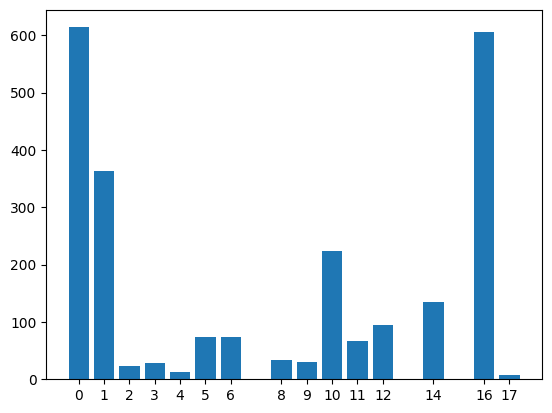

In [ ]:
val_pos = [pos for sample in val for pos in sample['upos']]# if pos != 17]
unique_val_pos, counts = np.unique(val_pos, return_counts=True)
plt.bar(unique_val_pos, counts)
plt.xticks(unique_val_pos)
plt.show()

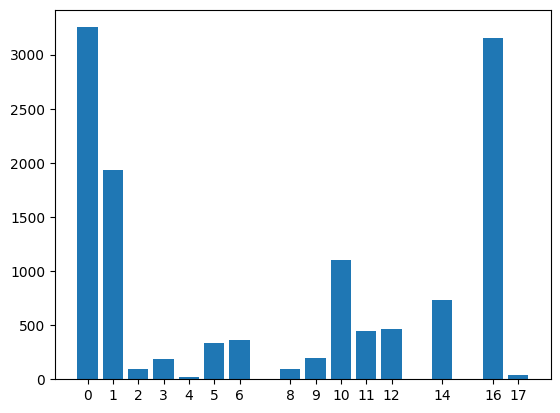

In [ ]:
pos = [pos for sample in train for pos in sample['upos']] #if pos != 17]
unique_pos, counts = np.unique(pos, return_counts=True)
plt.bar(unique_pos, counts)
#plt.hist(np.array([1,3,2,2,1,3,2,2,2,1]), bins=3)
plt.xticks(unique_pos)
plt.show()

## Download datasets from github

In [ ]:
languages = ['lug', 'pcm', 'xho', 'ibo', 'hau', 'swa']
%cd /content/
for lang in languages:
    !wget https://raw.githubusercontent.com/masakhane-io/masakhane-pos/main/data/{lang}/train.txt
    !wget https://raw.githubusercontent.com/masakhane-io/masakhane-pos/main/data/{lang}/dev.txt
    !wget https://raw.githubusercontent.com/masakhane-io/masakhane-pos/main/data/{lang}/test.txt
    !mv train.txt /content/probing/probing-main/examples/data/pos_tagging/{lang}/train
    !mv dev.txt /content/probing/probing-main/examples/data/pos_tagging/{lang}/dev
    !mv test.txt /content/probing/probing-main/examples/data/pos_tagging/{lang}/test

/content
--2024-09-26 04:54:36--  https://raw.githubusercontent.com/masakhane-io/masakhane-pos/main/data/lug/train.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 146481 (143K) [text/plain]
Saving to: ‘train.txt’

train.txt           100%[===================>] 143.05K  --.-KB/s    in 0.02s   

2024-09-26 04:54:36 (6.07 MB/s) - ‘train.txt’ saved [146481/146481]

--2024-09-26 04:54:36--  https://raw.githubusercontent.com/masakhane-io/masakhane-pos/main/data/lug/dev.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 25816 (25K) 

In [ ]:
from collections import Counter

def re_format_data(path: str, train_labels: set = None)->set:

    labels = set()
    # outliers = []

    os.makedirs(os.path.dirname(path), exist_ok=True)
    with open(path, 'r') as f:
        lines = f.readlines()

    i = 0
    with open(path, 'w') as f:
        for line in lines:
            if line == "\n":
                f.write('\n')
            else:
                # if re.split(r'[ \t]+', line)[1].strip() == "INTJ":
                #     continue
                line = line.replace(' ', '\t')
                label = re.split(r'[ \t]+', line)[1].strip()
                if (train_labels == None):
                    labels.add(label)
                else:
                    if label not in train_labels:
                        # outliers.append(label)
                        continue
                f.write(line)
                # i += 1
    # print(f"Size: {i}")
    # print(Counter(outliers))
    return labels


## Reformat the github datasets to tab-separated values

In [ ]:
# !wget https://raw.githubusercontent.com/masakhane-io/masakhane-pos/main/data/xho/train.txt
# !wget https://raw.githubusercontent.com/masakhane-io/masakhane-pos/main/data/xho/dev.txt
# !wget https://raw.githubusercontent.com/masakhane-io/masakhane-pos/main/data/xho/test.txt
# !mv train.txt /content/probing/probing-main/examples/data/pos_tagging/xho/train
# !mv dev.txt /content/probing/probing-main/examples/data/pos_tagging/xho/dev
# !mv test.txt /content/probing/probing-main/examples/data/pos_tagging/xho/test

--2024-09-26 14:25:50--  https://raw.githubusercontent.com/masakhane-io/masakhane-pos/main/data/xho/train.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 167518 (164K) [text/plain]
Saving to: ‘train.txt’

train.txt           100%[===================>] 163.59K  --.-KB/s    in 0.02s   

2024-09-26 14:25:50 (7.38 MB/s) - ‘train.txt’ saved [167518/167518]

--2024-09-26 14:25:50--  https://raw.githubusercontent.com/masakhane-io/masakhane-pos/main/data/xho/dev.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30102 (29K) [text/pla

In [ ]:
train_labels = re_format_data(f'/content/probing/probing-main/examples/data/pos_tagging/xho/train')
re_format_data(f'/content/probing/probing-main/examples/data/pos_tagging/xho/dev', train_labels)
re_format_data(f'/content/probing/probing-main/examples/data/pos_tagging/xho/test', train_labels)

set()

In [ ]:
for lang in languages:
    re_format_data(f'/content/probing/probing-main/examples/data/pos_tagging/{lang}/train')
    re_format_data(f'/content/probing/probing-main/examples/data/pos_tagging/{lang}/dev')
    re_format_data(f'/content/probing/probing-main/examples/data/pos_tagging/{lang}/test')

In [ ]:
# convert_to_tsv(train, '/content/probing/probing-main/examples/data/pos_tagging/zulu/train', tag_index_to_name)
# convert_to_tsv(val, '/content/probing/probing-main/examples/data/pos_tagging/zulu/dev', tag_index_to_name)
# convert_to_tsv(test, '/content/probing/probing-main/examples/data/pos_tagging/zulu/test', tag_index_to_name)

## Probe task for iziXhosa on the layers of all 6 models.

In [ ]:
lang = 'xho'
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/pos_tagging.yaml',
    control_task=False,
    task = "pos",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-09-26 05:26:13,591 - INFO - Data loaded
2024-09-26 05:26:13,591 - INFO - Train data size: 752
2024-09-26 05:26:13,591 - INFO - Dev data size: 150
2024-09-26 05:26:13,591 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-09-26 05:26:13,692 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since your

### Making inference on iziXhosa

In [ ]:
test_path = "/content/probing/probing-main/examples/data/pos_tagging/xho/test"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "pos",
               lang = "xho",
               control_task = False)

# model_root_path: str,
#     test_path: str,
#     checkpoints: str,
#     task: str,
#     lang: str,
#     control_task: bool = False

### Load and plot results for isiXhosa

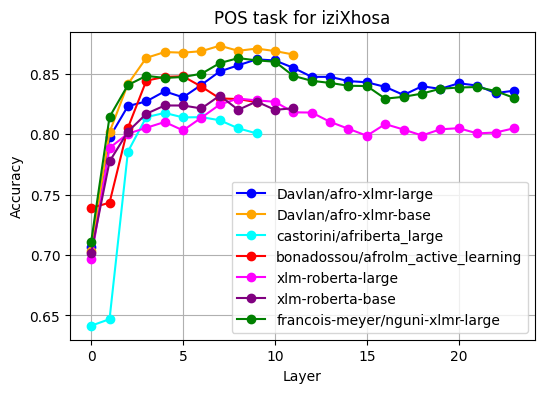

In [ ]:
results = load_results(root_dir = "/content/predictions/pos/probe/",
                       lang = "xho",
                       checkpoints = checkpoints_hidden_layer_sizes,
                       metric = "acc")
plot_results(results, "Parts-Of-Speech task for iziXhosa", "Accuracy")
# root_dir: str, lang: str, checkpoints: dict, metric: str

### Generate control datasets

In [ ]:
random.seed(2)
lang = 'xho'
generate_all_control_datasets(lang)

### Control task on isiXhosa

In [ ]:
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/pos_tagging.yaml',
    control_task=True, task = "pos",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-09-28 14:07:47,683 - INFO - Data loaded
2024-09-28 14:07:47,683 - INFO - Train data size: 752
2024-09-28 14:07:47,683 - INFO - Dev data size: 150
2024-09-28 14:07:47,683 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-09-28 14:07:47,774 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since your

### Make inference on Control Task for isiXhosa

In [ ]:
test_path = "/content/probing/probing-main/examples/data/pos_tagging/xho/test_control"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "pos",
               lang = "xho",
               control_task = True)

### Load results and plot Selectivity

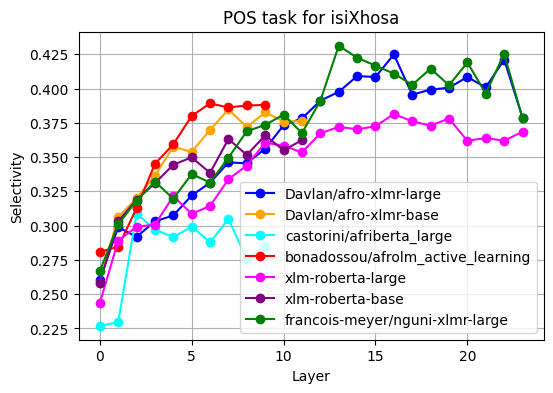

In [ ]:
load_and_plot_selectivity(lang="isiXhosa",
                          lang_code = "xho",
                          checkpoints = checkpoints_hidden_layer_sizes,
                          metric = "acc")


In [ ]:
# %rm -r /content/exps/pos/random_probe

## Probe task on Luganda for all 6 models

In [ ]:
lang = 'lug'
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/pos_tagging.yaml',
    control_task=False,
    task = "pos",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-09-26 19:48:42,693 - INFO - Data loaded
2024-09-26 19:48:42,693 - INFO - Train data size: 733
2024-09-26 19:48:42,693 - INFO - Dev data size: 146
2024-09-26 19:48:42,693 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-09-26 19:48:42,784 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since your

### Making inference on Luganda

In [ ]:
test_path = "/content/probing/probing-main/examples/data/pos_tagging/lug/test"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "pos",
               lang = "lug",
               control_task = False)

### Load and plot results for Luganda

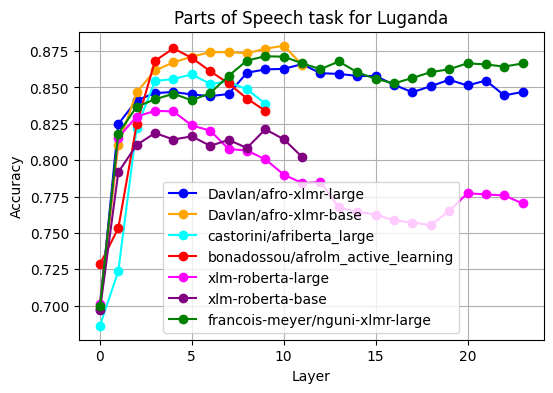

In [ ]:
results = load_results(root_dir = "/content/predictions/pos/probe/",
                       lang = "lug",
                       checkpoints = checkpoints_hidden_layer_sizes,
                       metric = "acc")
plot_results(results, "Parts of Speech task for Luganda", "Accuracy")

### Control Task for Luganda

In [ ]:
random.seed(2)
lang = 'lug'
generate_all_control_datasets(lang)

run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/pos_tagging.yaml',
    control_task=True, task = "pos",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-09-29 03:49:27,336 - INFO - Data loaded
2024-09-29 03:49:27,336 - INFO - Train data size: 733
2024-09-29 03:49:27,336 - INFO - Dev data size: 146
2024-09-29 03:49:27,336 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-09-29 03:49:27,438 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since your

### Make inference on Control Task for Luganda

In [ ]:
lang = 'lug'
test_path = f"/content/probing/probing-main/examples/data/pos_tagging/{lang}/test_control"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "pos",
               lang = lang,
               control_task = True)

### Load and plot Selectivity results for Luganda

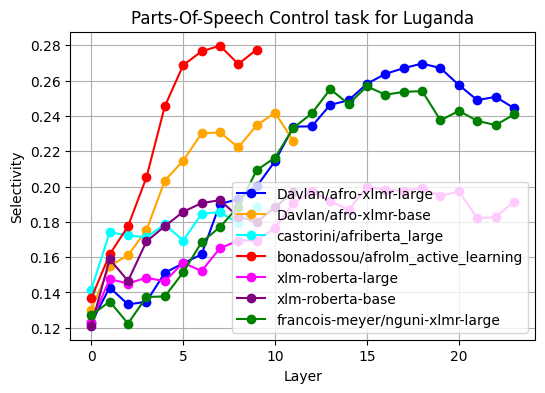

In [ ]:
load_and_plot_selectivity(lang="Luganda",
                          lang_code = "lug",
                          checkpoints = checkpoints_hidden_layer_sizes,
                          metric = "acc")


## Probe Task on Swahili for all 6 models

In [ ]:
lang = 'swa'
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/pos_tagging.yaml',
    control_task=False,
    task = "pos",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-09-27 03:41:00,314 - INFO - Data loaded
2024-09-27 03:41:00,314 - INFO - Train data size: 693
2024-09-27 03:41:00,314 - INFO - Dev data size: 138
2024-09-27 03:41:00,314 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-09-27 03:41:00,415 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since your

### Making inference on Swahili

In [ ]:
test_path = "/content/probing/probing-main/examples/data/pos_tagging/swa/test"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "pos",
               lang = "swa",
               control_task = False)

### Load and make plots for Swahili

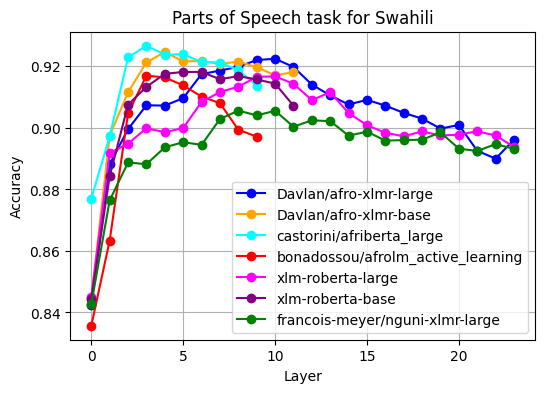

In [ ]:
results = load_results(root_dir = "/content/predictions/pos/probe/",
                       lang = "swa",
                       checkpoints = checkpoints_hidden_layer_sizes,
                       metric = "acc")
plot_results(results, "Parts of Speech task for Swahili", "Accuracy")

### Control Task for Swahili

In [ ]:
random.seed(2)
lang = 'swa'
generate_all_control_datasets(lang)

run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/pos_tagging.yaml',
    control_task=True, task = "pos",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-09-29 16:35:47,274 - INFO - Data loaded
2024-09-29 16:35:47,274 - INFO - Train data size: 693
2024-09-29 16:35:47,274 - INFO - Dev data size: 138
2024-09-29 16:35:47,274 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-09-29 16:35:47,393 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since your

### Make inference on Control task for Swahili

In [ ]:
lang = 'swa'
test_path = f"/content/probing/probing-main/examples/data/pos_tagging/{lang}/test_control"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "pos",
               lang = lang,
               control_task = True)

### Load and plot Selectivity results for Swahili

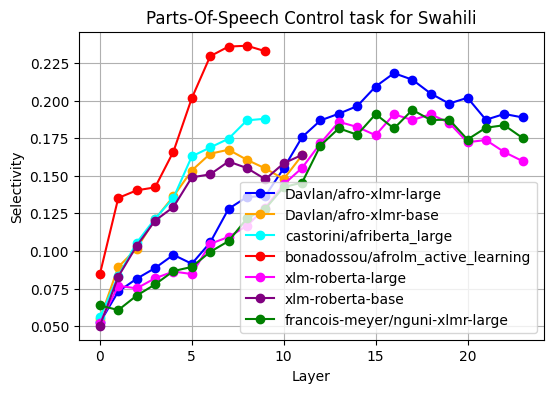

In [ ]:
load_and_plot_selectivity(lang="Swahili",
                          lang_code = "swa",
                          checkpoints = checkpoints_hidden_layer_sizes,
                          metric = "acc")


### Probe Task on Hausa for all 6 models

In [ ]:
lang = 'hau'
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/pos_tagging.yaml',
    control_task=False,
    task = "pos",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-09-27 12:02:24,716 - INFO - Data loaded
2024-09-27 12:02:24,716 - INFO - Train data size: 753
2024-09-27 12:02:24,716 - INFO - Dev data size: 150
2024-09-27 12:02:24,717 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-09-27 12:02:24,828 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since your

### Making inference on Hausa

In [ ]:
test_path = "/content/probing/probing-main/examples/data/pos_tagging/hau/test"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "pos",
               lang = "hau",
               control_task = False)

### Load and make plots for Hausa

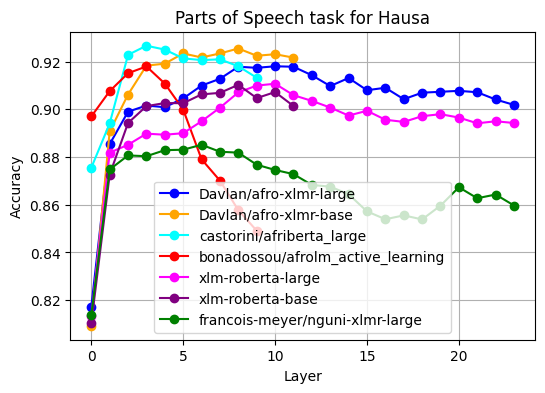

In [ ]:
results = load_results(root_dir = "/content/predictions/pos/probe/",
                       lang = "hau",
                       checkpoints = checkpoints_hidden_layer_sizes,
                       metric = "acc")
plot_results(results, "Parts of Speech task for Hausa", "Accuracy")

### Parts-of-Speech Control Task for Hausa

In [ ]:
random.seed(2)
lang = 'hau'
generate_all_control_datasets(lang)

run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/pos_tagging.yaml',
    control_task=True, task = "pos",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-09-30 08:55:13,421 - INFO - Data loaded
2024-09-30 08:55:13,421 - INFO - Train data size: 753
2024-09-30 08:55:13,421 - INFO - Dev data size: 150
2024-09-30 08:55:13,421 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-09-30 08:55:13,536 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since your

### Make inference on Conrol Task for Hausa

In [ ]:
lang = 'hau'
test_path = f"/content/probing/probing-main/examples/data/pos_tagging/{lang}/test_control"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "pos",
               lang = lang,
               control_task = True)

### Load and plot Selectivity results for Hausa

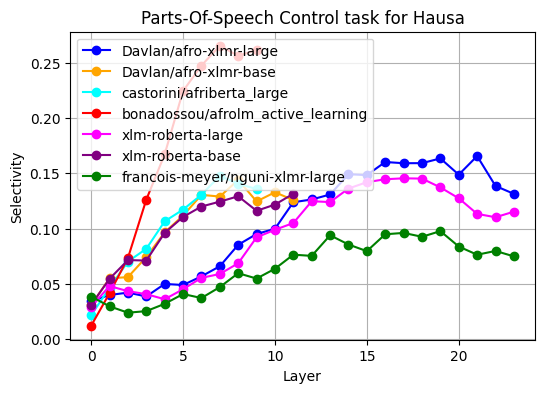

In [ ]:
load_and_plot_selectivity(lang="Hausa",
                          lang_code = "hau",
                          checkpoints = checkpoints_hidden_layer_sizes,
                          metric = "acc")


In [ ]:
%rm -r /content/exps/pos/control_probe/swa

### Probe Task on Igbo

In [ ]:
lang = 'ibo'
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/pos_tagging.yaml',
    control_task=False,
    task = "pos",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-09-27 19:35:08,687 - INFO - Data loaded
2024-09-27 19:35:08,687 - INFO - Train data size: 803
2024-09-27 19:35:08,687 - INFO - Dev data size: 160
2024-09-27 19:35:08,687 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-09-27 19:35:08,781 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since your

### Make inference on Igbo

In [ ]:
test_path = "/content/probing/probing-main/examples/data/pos_tagging/ibo/test"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "pos",
               lang = "ibo",
               control_task = False)

### Load and make plots for Igbo

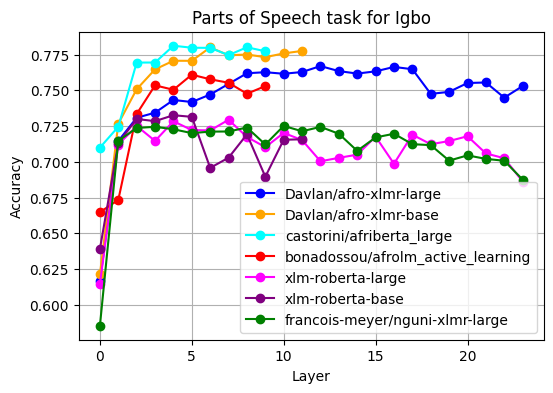

In [ ]:
results = load_results(root_dir = "/content/predictions/pos/probe/",
                       lang = "ibo",
                       checkpoints = checkpoints_hidden_layer_sizes,
                       metric = "acc")
plot_results(results, "Parts of Speech task for Igbo", "Accuracy")

### Parts-of-Speech Control task for Igbo

In [ ]:
random.seed(2)
lang = 'ibo'
generate_all_control_datasets(lang)

run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/pos_tagging.yaml',
    control_task=True, task = "pos",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-01 02:15:58,883 - INFO - Data loaded
2024-10-01 02:15:58,883 - INFO - Train data size: 803
2024-10-01 02:15:58,883 - INFO - Dev data size: 160
2024-10-01 02:15:58,883 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-10-01 02:15:58,989 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since your

### Make infrerence on Control Task for Igbo

In [ ]:
lang = 'ibo'
test_path = f"/content/probing/probing-main/examples/data/pos_tagging/{lang}/test_control"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "pos",
               lang = lang,
               control_task = True)

### Load and plot Selectivity for Igbo

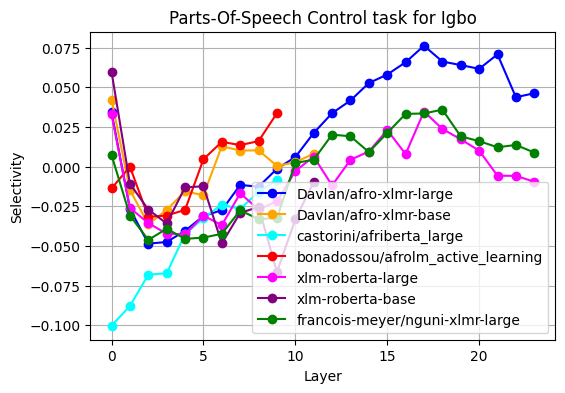

In [ ]:
load_and_plot_selectivity(lang="Igbo",
                          lang_code = "ibo",
                          checkpoints = checkpoints_hidden_layer_sizes,
                          metric = "acc")


### Probe Task on Naija Pidgin

In [ ]:
lang = 'pcm'
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/pos_tagging.yaml',
    control_task=False,
    task = "pos",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-09-28 06:35:39,110 - INFO - Data loaded
2024-09-28 06:35:39,110 - INFO - Train data size: 752
2024-09-28 06:35:39,110 - INFO - Dev data size: 150
2024-09-28 06:35:39,110 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-09-28 06:35:39,288 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since your

### Make inference on Naija Pidgin

In [ ]:
test_path = "/content/probing/probing-main/examples/data/pos_tagging/pcm/test"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "pos",
               lang = "pcm",
               control_task = False)

### Load data and make plots for Naija Pidgin

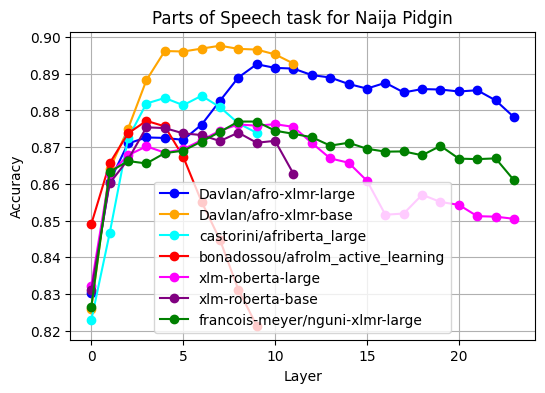

In [ ]:
results = load_results(root_dir = "/content/predictions/pos/probe/",
                       lang = "pcm",
                       checkpoints = checkpoints_hidden_layer_sizes,
                       metric = "acc")
plot_results(results, "Parts of Speech task for Naija Pidgin", "Accuracy")

### Parts-of-Speech Control Task for Naija Pidgin

In [ ]:
random.seed(2)
lang = 'pcm'
generate_all_control_datasets(lang)

run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/pos_tagging.yaml',
    control_task=True, task = "pos",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-01 19:55:20,644 - INFO - Data loaded
2024-10-01 19:55:20,645 - INFO - Train data size: 752
2024-10-01 19:55:20,645 - INFO - Dev data size: 150
2024-10-01 19:55:20,645 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-10-01 19:55:20,751 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since your

### Make inference on Control Task for Naija Pidgin

In [ ]:
lang = 'pcm'
test_path = f"/content/probing/probing-main/examples/data/pos_tagging/{lang}/test_control"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "pos",
               lang = lang,
               control_task = True)

/content/probing/probing-main/src/probing
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-02 12:13:21,861 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.
2024-10-02 12:13:27,420 - INFO - Loading model from /content/exps/pos/control_probe/pcm/Davlan/afro-xlmr-large/layer_1/0000/model
/content/probing/probing-main/src/probing
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces

### Load and plot Selectivity for Naija Pidgin

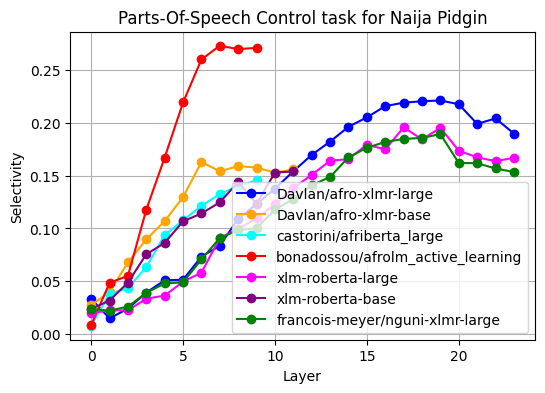

In [ ]:
load_and_plot_selectivity(lang="Naija Pidgin",
                          lang_code = "pcm",
                          checkpoints = checkpoints_hidden_layer_sizes,
                          metric = "acc")

In [ ]:
# %rm -r /content/exps/pos/control_probe/pcm

rm: cannot remove '/content/exps/pos/control_probe/pcm': No such file or directory


## Train the probe on the layers of randomly initialized weights.

In [ ]:
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/pos_tagging.yaml',
    randomize_weights=True,
    lang="zulu",
    batch_size=128)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
2024-08-25 05:16:17,471 - INFO - Data loaded
2024-08-25 05:16:17,471 - INFO - Train data size: 753
2024-08-25 05:16:17,472 - INFO - Dev data size: 150
2024-08-25 05:16:17,472 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
2024-08-25 05:16:17,744 - INFO - Loading Davlan/afro-xlmr-large with random weights.
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting

In [ ]:
#%rm -r /content/predictions

In [ ]:
def load_results(root_dir: str, lang: str, checkpoints: dict, metric: str)->dict:
    results = {}
    for checkpoint in checkpoints:
        with open(f"{root_dir}/{lang}/{checkpoint}/results.txt", 'r') as f:
            lines = f.readlines()
            if metric == "f1":
                results[checkpoint] = [float(line.split('\t')[-1]) for line in lines]
            else:
                results[checkpoint] = [float(line.split('\t')[0]) for line in lines]
    return results

In [ ]:
import matplotlib.pyplot as plt

def plot_results(results: dict, title: str, y_label: str, random_baseline: float = None)-> None:

    x = []
    colors = ["blue", "orange", "cyan", "red", "magenta", "purple", "green", "black"]
    plt.figure(figsize=(6, 4))
    for i, (checkpoint, values) in enumerate(results.items()):
        x = list(range(len(values)))

        plt.plot(x, values, marker='o', label=checkpoint, color=colors[i])

    if random_baseline is not None:
        random_baseline = [random_baseline] * 24
        plt.plot(random_baseline, label='Random Baseline', color = colors[7])

    plt.title(title)
    plt.xlabel('Layer')
    plt.ylabel(y_label)

    plt.legend()
    plt.grid(True)

    plt.savefig(f"{title}.png")
    plt.show()


## Plot results for all the models.

In [ ]:
def create_dataframe(results: dict, baseline: dict = None, transpose: bool = True):
    results_tabel = {}
    for key, value in results.items():
        values = results[key]
        if baseline is not None:
            baseline_values = baseline[key]
            values = [round(val - base, 2) for val, base in zip(values, baseline_values)]
        values = [round(val * 100, 2) for val in values]
        results_tabel[key] = values
        if len(values) < 24:
            results_tabel[key] = results_tabel[key] + ["-"] * (24 - len(results[key]))
    if transpose == False:
        pd.set_option('display.max_columns', None)
        return pd.DataFrame(results_tabel, index=layer_labels)

    rt = pd.DataFrame.from_dict(results_tabel, orient='index', columns=layer_labels)
    pd.set_option('display.max_columns', None)
    return rt

## Named Entity Recognition

In [ ]:
languages = ['lug', 'pcm', 'xho', 'ibo', 'hau', 'swa']
for lang in languages:
    !wget https://raw.githubusercontent.com/masakhane-io/masakhane-ner/main/MasakhaNER2.0/data/{lang}/train.txt
    !wget https://raw.githubusercontent.com/masakhane-io/masakhane-ner/main/MasakhaNER2.0/data/{lang}/dev.txt
    !wget https://raw.githubusercontent.com/masakhane-io/masakhane-ner/main/MasakhaNER2.0/data/{lang}/test.txt
    os.makedirs(os.path.dirname(f"/content/probing/probing-main/examples/data/ner_tagging/{lang}/train"), exist_ok=True)
    !mv train.txt /content/probing/probing-main/examples/data/ner_tagging/{lang}/train
    !mv dev.txt /content/probing/probing-main/examples/data/ner_tagging/{lang}/dev
    !mv test.txt /content/probing/probing-main/examples/data/ner_tagging/{lang}/test

--2024-09-26 05:00:05--  https://raw.githubusercontent.com/masakhane-io/masakhane-ner/main/MasakhaNER2.0/data/lug/train.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 821977 (803K) [text/plain]
Saving to: ‘train.txt’

train.txt           100%[===================>] 802.71K  --.-KB/s    in 0.03s   

2024-09-26 05:00:06 (23.9 MB/s) - ‘train.txt’ saved [821977/821977]

--2024-09-26 05:00:06--  https://raw.githubusercontent.com/masakhane-io/masakhane-ner/main/MasakhaNER2.0/data/lug/dev.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
L

### Reformat Datasets

In [ ]:
languages = ['lug', 'pcm', 'xho', 'ibo', 'hau', 'swa']
for lang in languages:
    train_labels = re_format_data(f'/content/probing/probing-main/examples/data/ner_tagging/{lang}/train')
    re_format_data(f'/content/probing/probing-main/examples/data/ner_tagging/{lang}/dev', train_labels)
    re_format_data(f'/content/probing/probing-main/examples/data/ner_tagging/{lang}/test', train_labels)
# re_format_data('/content/probing/probing-main/examples/data/ner_tagging/zulu/train')
# re_format_data('/content/probing/probing-main/examples/data/ner_tagging/zulu/dev')
# re_format_data('/content/probing/probing-main/examples/data/ner_tagging/zulu/test')

### NER probing task for Luganda

In [ ]:
lang = 'lug'
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/ner_tagging.yaml',
    control_task=False,
    task = "ner",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-03 12:09:49,376 - INFO - Data loaded
2024-10-03 12:09:49,376 - INFO - Train data size: 4942
2024-10-03 12:09:49,376 - INFO - Dev data size: 706
2024-10-03 12:09:49,376 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-10-03 12:09:49,478 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since you

### Make inference on Named Entity Recognition Task for Luganda

In [ ]:
test_path = "/content/probing/probing-main/examples/data/ner_tagging/lug/test"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "ner",
               lang = "lug",
               control_task = False)

### Load and plot results for Luganda

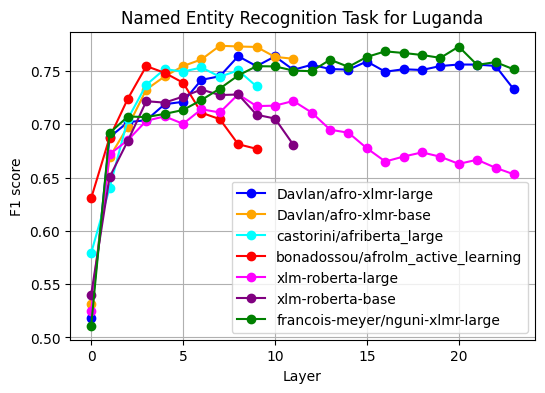

In [ ]:
results = load_results(root_dir = "/content/predictions/ner/probe/",
                       lang = "lug",
                       checkpoints = checkpoints_hidden_layer_sizes,
                       metric = "f1")
plot_results(results=results, title="Named Entity Recognition Task for Luganda", y_label="F1 score")

### Random baseline task for Luganda

In [ ]:
lang = 'lug'
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/ner_tagging.yaml',
    control_task=True,
    task = "ner",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-16 09:42:31,018 - INFO - Data loaded
2024-10-16 09:42:31,018 - INFO - Train data size: 4942
2024-10-16 09:42:31,018 - INFO - Dev data size: 706
2024-10-16 09:42:31,018 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-10-16 09:42:31,179 - INFO - Loading Davlan/afro-xlmr-large with random weights.
We strongly recommend passing in an `atten

### Make inference on control baselines for Luganda

In [ ]:
test_path = "/content/probing/probing-main/examples/data/ner_tagging/lug/test"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "ner",
               lang = "lug",
               control_task = True)

/content/probing/probing-main/src/probing
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-16 15:44:11,563 - INFO - Loading Davlan/afro-xlmr-large with random weights.
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.
2024-10-16 15:44:21,964 - INFO - Loading model from /content/exps/ner/control_probe/lug/Davlan/afro-xlmr-large/layer_1/0000/model
/content/probing/probing-main/src/probing
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up

In [ ]:
#  %rm -r /content/exps/ner/control_probe/

### Random Baseline for Igbo

In [ ]:
lang = 'ibo'
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/ner_tagging.yaml',
    control_task=True,
    task = "ner",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-16 23:22:01,539 - INFO - Data loaded
2024-10-16 23:22:01,539 - INFO - Train data size: 7634
2024-10-16 23:22:01,540 - INFO - Dev data size: 1090
2024-10-16 23:22:01,540 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-10-16 23:22:01,651 - INFO - Loading Davlan/afro-xlmr-large with random weights.
We strongly recommend passing in an `atte

### Make inference on baselines for Igbo

In [ ]:
lang = 'ibo'
test_path = f"/content/probing/probing-main/examples/data/ner_tagging/{lang}/test"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "ner",
               lang = lang,
               control_task = True)

/content/probing/probing-main/src/probing
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-17 11:58:34,397 - INFO - Loading Davlan/afro-xlmr-large with random weights.
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.
2024-10-17 11:58:44,965 - INFO - Loading model from /content/exps/ner/control_probe/ibo/Davlan/afro-xlmr-large/layer_1/0000/model
/content/probing/probing-main/src/probing
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up

### Random baselines for isiXhosa

In [ ]:
lang = 'xho'
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/ner_tagging.yaml',
    control_task=True,
    task = "ner",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-17 13:56:40,719 - INFO - Data loaded
2024-10-17 13:56:40,719 - INFO - Train data size: 5718
2024-10-17 13:56:40,719 - INFO - Dev data size: 817
2024-10-17 13:56:40,719 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-10-17 13:56:40,908 - INFO - Loading Davlan/afro-xlmr-large with random weights.
We strongly recommend passing in an `atten

### Make inference on baselines for isiXhosa

In [ ]:
lang = 'xho'
test_path = f"/content/probing/probing-main/examples/data/ner_tagging/{lang}/test"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "ner",
               lang = lang,
               control_task = True)

/content/probing/probing-main/src/probing
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-17 18:41:59,456 - INFO - Loading Davlan/afro-xlmr-large with random weights.
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.
2024-10-17 18:42:09,809 - INFO - Loading model from /content/exps/ner/control_probe/xho/Davlan/afro-xlmr-large/layer_1/0000/model
/content/probing/probing-main/src/probing
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up

### Random baselines for Naija Pidgin

In [ ]:
lang = 'pcm'
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/ner_tagging.yaml',
    control_task=True,
    task = "ner",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-17 20:02:33,708 - INFO - Data loaded
2024-10-17 20:02:33,708 - INFO - Train data size: 5646
2024-10-17 20:02:33,708 - INFO - Dev data size: 806
2024-10-17 20:02:33,708 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-10-17 20:02:33,803 - INFO - Loading Davlan/afro-xlmr-large with random weights.
We strongly recommend passing in an `atten

### Inference on baselines for Naija Pidgin

In [ ]:
lang = 'pcm'
test_path = f"/content/probing/probing-main/examples/data/ner_tagging/{lang}/test"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "ner",
               lang = lang,
               control_task = True)

/content/probing/probing-main/src/probing
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-18 04:40:25,722 - INFO - Loading Davlan/afro-xlmr-large with random weights.
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.
2024-10-18 04:40:35,827 - INFO - Loading model from /content/exps/ner/control_probe/pcm/Davlan/afro-xlmr-large/layer_1/0000/model
/content/probing/probing-main/src/probing
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up

### Random baseline task for Hausa

In [ ]:
lang = 'hau'
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/ner_tagging.yaml',
    control_task=True,
    task = "ner",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-18 05:58:31,765 - INFO - Data loaded
2024-10-18 05:58:31,765 - INFO - Train data size: 5716
2024-10-18 05:58:31,765 - INFO - Dev data size: 816
2024-10-18 05:58:31,765 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-10-18 05:58:31,859 - INFO - Loading Davlan/afro-xlmr-large with random weights.
We strongly recommend passing in an `atten

### Make inference on random baselined for Hausa

In [ ]:
lang = 'hau'
test_path = f"/content/probing/probing-main/examples/data/ner_tagging/{lang}/test"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "ner",
               lang = lang,
               control_task = True)

/content/probing/probing-main/src/probing
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-18 13:27:47,610 - INFO - Loading Davlan/afro-xlmr-large with random weights.
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.
2024-10-18 13:28:05,357 - INFO - Loading model from /content/exps/ner/control_probe/hau/Davlan/afro-xlmr-large/layer_1/0000/model
/content/probing/probing-main/src/probing
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up

### Random baseline task for Swahili

In [ ]:
lang = 'swa'
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/ner_tagging.yaml',
    control_task=True,
    task = "ner",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-18 14:53:41,261 - INFO - Data loaded
2024-10-18 14:53:41,261 - INFO - Train data size: 6593
2024-10-18 14:53:41,261 - INFO - Dev data size: 942
2024-10-18 14:53:41,262 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-10-18 14:53:41,364 - INFO - Loading Davlan/afro-xlmr-large with random weights.
We strongly recommend passing in an `atten

### Make inference on baselines for Swahili

In [ ]:
lang = 'swa'
test_path = f"/content/probing/probing-main/examples/data/ner_tagging/{lang}/test"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "ner",
               lang = lang,
               control_task = True)

/content/probing/probing-main/src/probing
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-18 23:21:44,877 - INFO - Loading Davlan/afro-xlmr-large with random weights.
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.
2024-10-18 23:22:04,922 - INFO - Loading model from /content/exps/ner/control_probe/swa/Davlan/afro-xlmr-large/layer_1/0000/model
/content/probing/probing-main/src/probing
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up

### NER probing task for isiXhosa

In [ ]:
lang = 'xho'
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/ner_tagging.yaml',
    control_task=False,
    task = "ner",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-04 06:36:15,773 - INFO - Data loaded
2024-10-04 06:36:15,773 - INFO - Train data size: 5718
2024-10-04 06:36:15,773 - INFO - Dev data size: 817
2024-10-04 06:36:15,773 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-10-04 06:36:15,887 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since you

### Make inference on NER test set for isiXhosa

In [ ]:
lang = 'xho'
test_path = f"/content/probing/probing-main/examples/data/ner_tagging/{lang}/test"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "ner",
               lang = lang,
               control_task = False)

### Load and plot NER results for isiXhosa

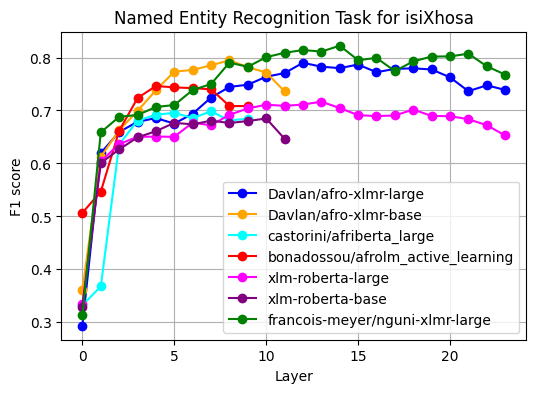

In [ ]:
results = load_results(root_dir = "/content/predictions/ner/probe/",
                       lang = "xho",
                       checkpoints = checkpoints_hidden_layer_sizes,
                       metric = "f1")
plot_results(results=results, title="Named Entity Recognition Task for isiXhosa", y_label="F1 score")

### NER Probing Task for Igbo

In [ ]:
lang = 'ibo'
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/ner_tagging.yaml',
    control_task=False,
    task = "ner",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-04 19:50:51,334 - INFO - Data loaded
2024-10-04 19:50:51,334 - INFO - Train data size: 7634
2024-10-04 19:50:51,334 - INFO - Dev data size: 1090
2024-10-04 19:50:51,334 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-10-04 19:50:51,417 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since yo

### Make inference on test set for Igbo

In [ ]:
lang = 'ibo'
test_path = f"/content/probing/probing-main/examples/data/ner_tagging/{lang}/test"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "ner",
               lang = lang,
               control_task = False)

### Load and plot results for Igbo

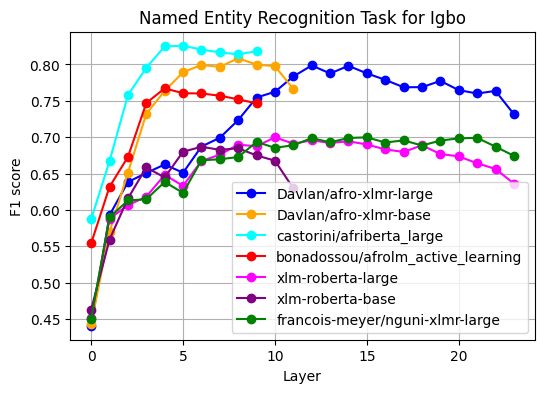

In [ ]:
results = load_results(root_dir = "/content/predictions/ner/probe/",
                       lang = "ibo",
                       checkpoints = checkpoints_hidden_layer_sizes,
                       metric = "f1")
plot_results(results=results, title="Named Entity Recognition Task for Igbo", y_label="F1 score")

### NER probing task on Hausa

In [ ]:
lang = 'hau'
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/ner_tagging.yaml',
    control_task=False,
    task = "ner",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-05 20:55:11,897 - INFO - Data loaded
2024-10-05 20:55:11,898 - INFO - Train data size: 5716
2024-10-05 20:55:11,898 - INFO - Dev data size: 816
2024-10-05 20:55:11,898 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-10-05 20:55:12,002 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since you

### Make inference on NER test dataset for Hausa

In [ ]:
lang = 'hau'
test_path = f"/content/probing/probing-main/examples/data/ner_tagging/{lang}/test"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "ner",
               lang = lang,
               control_task = False)

### Load and plot NER results for Hausa

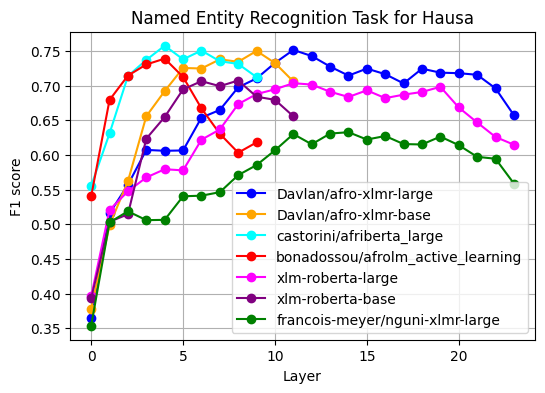

In [ ]:
results = load_results(root_dir = "/content/predictions/ner/probe/",
                       lang = "hau",
                       checkpoints = checkpoints_hidden_layer_sizes,
                       metric = "f1")
plot_results(results=results, title="Named Entity Recognition Task for Hausa", y_label="F1 score")

### NER Control Task for Hausa

In [ ]:
random.seed(42)
lang = 'hau'
generate_all_ner_control_datasets(lang=lang)

run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/ner_tagging.yaml',
    control_task=True, task = "ner",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-10 18:40:56,354 - INFO - Data loaded
2024-10-10 18:40:56,354 - INFO - Train data size: 5706
2024-10-10 18:40:56,354 - INFO - Dev data size: 815
2024-10-10 18:40:56,354 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-10-10 18:40:56,441 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since you

### Make inference on NER control task for Hausa

In [ ]:
lang = 'hau'
test_path = f"/content/probing/probing-main/examples/data/ner_tagging/{lang}/test_control"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "ner",
               lang = lang,
               control_task = True)

/content/probing/probing-main/src/probing
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-11 13:47:04,590 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.
2024-10-11 13:47:09,915 - INFO - Loading model from /content/exps/ner/control_probe/hau/Davlan/afro-xlmr-large/layer_1/0000/model
/content/probing/probing-main/src/probing
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces

In [ ]:
%rm -r /content/exps/ner/control_probe/pcm

### Load and plot Selectivity results for Hausa

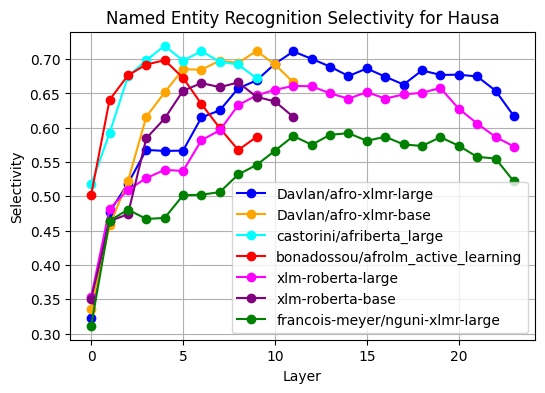

In [ ]:
load_and_plot_selectivity(lang="Hausa",
                          lang_code = "hau",
                          checkpoints = checkpoints_hidden_layer_sizes,
                          metric = "f1", task="ner")

In [ ]:
generate_all_ner_control_datasets(lang='hau')

### NER probe task for Swahili

In [ ]:
lang = 'swa'
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/ner_tagging.yaml',
    control_task=False,
    task = "ner",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-06 12:52:44,461 - INFO - Data loaded
2024-10-06 12:52:44,461 - INFO - Train data size: 6593
2024-10-06 12:52:44,461 - INFO - Dev data size: 942
2024-10-06 12:52:44,461 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-10-06 12:52:44,556 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since you

### Make inference on NER for Swahili

In [ ]:
lang = 'swa'
test_path = f"/content/probing/probing-main/examples/data/ner_tagging/{lang}/test"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "ner",
               lang = lang,
               control_task = False)

### Load and plot NER results for Swahili

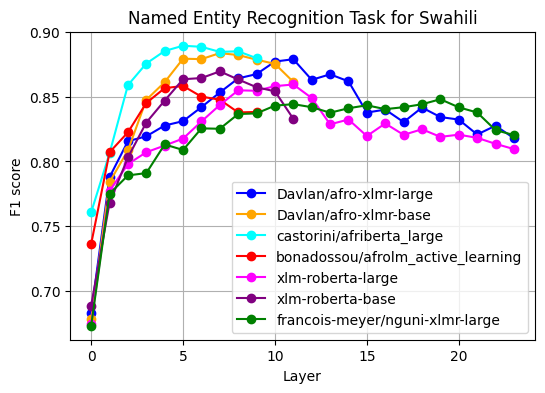

In [ ]:
results = load_results(root_dir = "/content/predictions/ner/probe/",
                       lang = "swa",
                       checkpoints = checkpoints_hidden_layer_sizes,
                       metric = "f1")
plot_results(results=results, title="Named Entity Recognition Task for Swahili", y_label="F1 score")

### NER Control task for Swahili

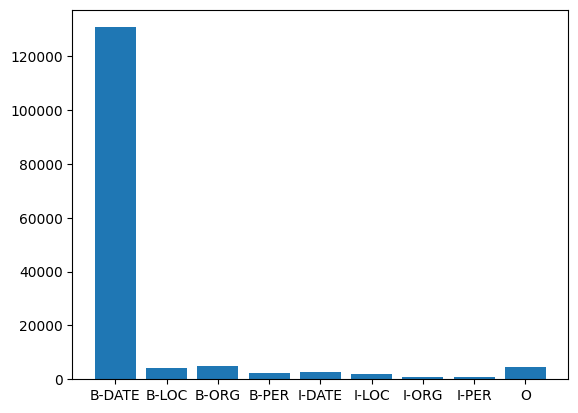

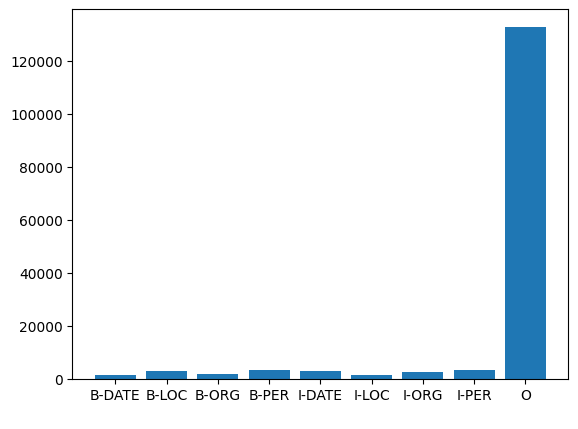

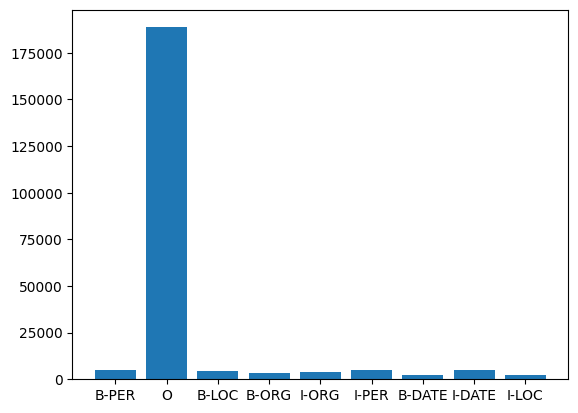

In [ ]:
random.seed(42)
lang = 'hau'
generate_all_control_datasets(task='ner', lang=lang)

# run_training_experiments(
#     checkpoints = checkpoints_hidden_layer_sizes,
#     config_path = '/content/probing/probing-main/examples/config/ner_tagging.yaml',
#     control_task=True, task = "ner",
#     lang=lang,
#     batch_size=32)

In [ ]:
train_path = '/content/probing/probing-main/examples/data/ner_tagging/xho/train'
dev_path = '/content/probing/probing-main/examples/data/ner_tagging/xho/dev'
test_path = '/content/probing/probing-main/examples/data/ner_tagging/xho/test'
config_path = '/content/probing/probing-main/examples/config/ner_tagging.yaml'
# config_path = '/content/probing/probing-main/examples/config/ner_tagging_bonadossou/afrolm_active_learning.yaml'

%cd /content/probing/probing-main/src
!python probing/train.py \
    --config {config_path} \
    --train-file {train_path} \
    --dev-file {dev_path}

/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/convert_slow_tokenizer.py:551: UserWarning: The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.
  warnings.warn(
2024-10-15 13:00:02,717 - INFO - Data loaded
2024-10-15 13:00:02,718 - INFO - 

In [ ]:
checkpoints_hidden_layer_sizes

{'Davlan/afro-xlmr-large': (25, 1024),
 'Davlan/afro-xlmr-base': (13, 768),
 'castorini/afriberta_large': (11, 768),
 'bonadossou/afrolm_active_learning': (11, 768),
 'xlm-roberta-large': (25, 1024),
 'xlm-roberta-base': (13, 768),
 'francois-meyer/nguni-xlmr-large': (25, 1024)}

In [ ]:
def evaluate(
    model_root_path: str,
    test_path: str,
    checkpoints: str,
    task: str,
    lang: str,
    control_task: bool = False,
    ):

    probe_type = "random_baselines" if control_task else "probe"

    targets = labels_to_list(test_path, task == 'ner')
    accuracies = []
    predictions = []
    f1_scores = []

    # Read target labels from the test file
    # with open(test_path, 'r') as f:
    #     lines = f.readlines()
    #     for line in lines:
    #         if not line == '\n':
    #             targets.append(line.split('\t')[1].strip())

    # for i, (checkpoint, _) in enumerate(checkpoints.items()):

    accuracies = []
    f1_scores = []  # Reset f1_scores for each checkpoint

    output = f"/content/predictions/{task}/{probe_type}/{lang}/preds.txt"
    results = output.replace("preds.txt", "results.txt")
    os.makedirs(os.path.dirname(results), exist_ok=True)
    with open(results, 'w') as results_file:

            # for layer in range(1, checkpoints[checkpoint][0]):
                exp_dir = f"{model_root_path}/{task}/{probe_type}/{lang}/0000"
                os.makedirs(os.path.dirname(output), exist_ok=True)
                %cd /content/probing/probing-main/src/probing
                !python inference.py \
                --experiment-dir {exp_dir} \
                --test-file {test_path} \
                > {output}

                # Clear predictions for the current layer
                predictions = labels_to_list(output, task == 'ner')

                # with open(output, 'r') as f:
                #     lines = f.readlines()
                #     for line in lines:
                #         if not line == '\n':
                #             predictions.append(line.split('\t')[1].strip())

                # correct_predictions = sum([1 for a, b in zip(predictions, targets) if a == b])
                # accuracy = correct_predictions / len(predictions)
                # print(f"test: {targets[-1]}    preds: {predictions[-1]}")
                if task == 'ner':
                    accuracy = seqeval.accuracy_score(targets, predictions)
                    f1 = seqeval.f1_score(targets, predictions, mode='strict', scheme=IOB2)
                else:
                    accuracy = sklearn.accuracy_score(targets, predictions)
                    f1 = sklearn.f1_score(targets, predictions, average='weighted')

                f1_scores.append(f1)
                accuracies.append(str(accuracy))

                for i, (accuracy, f1) in enumerate(zip(accuracies, f1_scores)):
                    if i < len(accuracies) - 1:
                        results_file.write(accuracy + '\t' + str(f1) + '\n')
                    else:
                        results_file.write(accuracy + '\t' + str(f1))


In [ ]:
lang = 'ibo'
test_path = f"/content/probing/probing-main/examples/data/ner_tagging/{lang}/test"

evaluate(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "ner",
               lang = lang,
               control_task = True)

# model_root_path: str,
#     test_path: str,
#     checkpoints: str,
#     task: str,
#     lang: str,
#     control_task: bool = False

/content/probing/probing-main/src/probing
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/convert_slow_tokenizer.py:551: UserWarning: The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.
  warnings.warn(
2024-10-16 05:02:40,868 - INFO - Loading castorini/afriberta_large wit

In [ ]:
def random_baselines(task: str, batch_size: int =32):
    config_path = f'/content/probing/probing-main/examples/config/{task}_tagging.yaml'

    # os.makedirs(os.path.dirname(config_path), exist_ok=True)
    with open(config_path, 'r') as f:
        config = yaml.safe_load(f)

    languages = ['lug', 'pcm', 'xho', 'ibo', 'hau', 'swa']
    for lang in languages:
        config['experiment_dir'] = f'/content/exps/{task}/random_baselines/{lang}'

        train_path = f'/content/probing/probing-main/examples/data/{task}_tagging/{lang}/train'
        dev_path = f'/content/probing/probing-main/examples/data/{task}_tagging/{lang}/dev'

        with open(config_path, 'w') as f:
                yaml.dump(config, f, default_flow_style=False)

        %cd /content/probing/probing-main/src
        !python probing/train.py \
            --config {config_path} \
            --train-file {train_path} \
            --dev-file {dev_path}

In [ ]:
#%rm -r /content/exps/ner/random_baselines

### Random baselines for NER

In [ ]:
random_baselines(task='ner')

/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/convert_slow_tokenizer.py:551: UserWarning: The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.
  warnings.warn(
2024-10-15 13:30:33,140 - INFO - Data loaded
2024-10-15 13:30:33,140 - INFO - 

### Random baselines for POS

In [ ]:
random_baselines(task='pos')

/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-15 13:54:57,525 - INFO - Data loaded
2024-10-15 13:54:57,525 - INFO - Train data size: 733
2024-10-15 13:54:57,525 - INFO - Dev data size: 146
2024-10-15 13:54:57,525 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-10-15 13:54:57,614 - INFO - Loading bert-base-multilingual-cased with random weights.
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.
2024-10-

In [ ]:
#random_baselines(task='pos')

### Make inference on NER control task for Swahili

In [ ]:
lang = 'swa'
test_path = f"/content/probing/probing-main/examples/data/ner_tagging/{lang}/test_control"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "ner",
               lang = lang,
               control_task = True)

### Load and plot Selectivity for Swahili

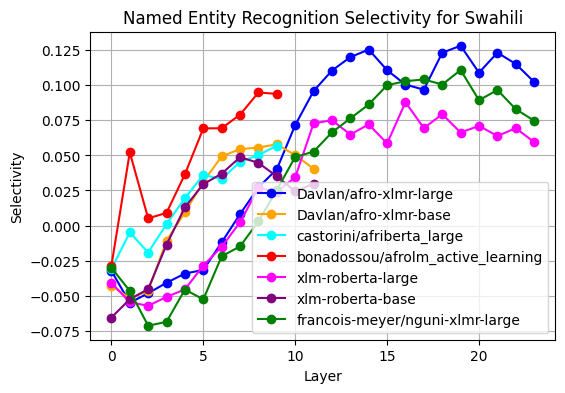

In [ ]:
load_and_plot_selectivity(lang="Swahili",
                          lang_code = "swa",
                          checkpoints = checkpoints_hidden_layer_sizes,
                          metric = "f1", task="ner")

### NER probing for Naija Pidgin

In [ ]:
lang = 'pcm'
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/ner_tagging.yaml',
    control_task=False,
    task = "ner",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-07 08:56:16,196 - INFO - Data loaded
2024-10-07 08:56:16,196 - INFO - Train data size: 5646
2024-10-07 08:56:16,197 - INFO - Dev data size: 806
2024-10-07 08:56:16,197 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-10-07 08:56:16,309 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since you

### Make inference on NER for Naija Pidgin

In [ ]:
lang = 'pcm'
test_path = f"/content/probing/probing-main/examples/data/ner_tagging/{lang}/test"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "ner",
               lang = lang,
               control_task = False)

### Load and plot NER results for Naija Pidgin

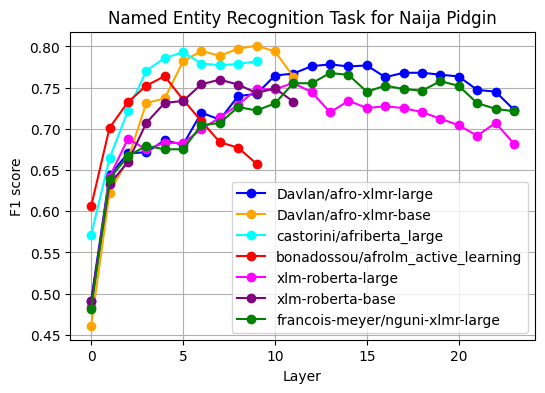

In [ ]:
results = load_results(root_dir = "/content/predictions/ner/probe/",
                       lang = "pcm",
                       checkpoints = checkpoints_hidden_layer_sizes,
                       metric = "f1")
plot_results(results=results, title="Named Entity Recognition Task for Naija Pidgin", y_label="F1 score")

### NER Control task for Naija Pidgin

In [ ]:
random.seed(42)
lang = 'pcm'
generate_all_control_datasets(task='ner', lang=lang)

run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/ner_tagging.yaml',
    control_task=True, task = "ner",
    lang=lang,
    batch_size=32)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-08 03:23:31,616 - INFO - Data loaded
2024-10-08 03:23:31,616 - INFO - Train data size: 5646
2024-10-08 03:23:31,616 - INFO - Dev data size: 806
2024-10-08 03:23:31,616 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-10-08 03:23:31,749 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since you

### Make inference on Control task for Naija Pidgin

In [ ]:
lang = 'pcm'
test_path = f"/content/probing/probing-main/examples/data/ner_tagging/{lang}/test_control"

evaluate_model(model_root_path = "/content/exps",
               test_path = test_path,
               checkpoints = checkpoints_hidden_layer_sizes,
               task = "ner",
               lang = lang,
               control_task = True)

### Load and plot Selectivity for Naija Pidgin

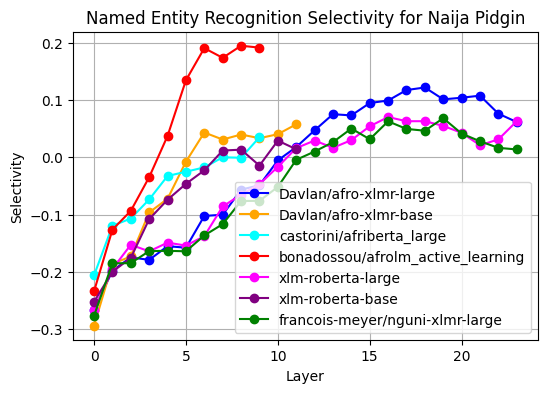

In [ ]:
load_and_plot_selectivity(lang="Naija Pidgin",
                          lang_code = "pcm",
                          checkpoints = checkpoints_hidden_layer_sizes,
                          metric = "f1", task="ner")

In [ ]:
train_path = '/content/probing/probing-main/examples/data/ner_tagging/pcm/train_control'
dev_path = '/content/probing/probing-main/examples/data/ner_tagging/pcm/dev_control'
test_path = '/content/probing/probing-main/examples/data/ner_tagging/pcm/test_control'
config_path = '/content/probing/probing-main/examples/config/ner_tagging.yaml'

%cd /content/probing/probing-main/src
!python probing/train.py \
    --config {config_path} \
    --train-file {train_path} \
    --dev-file {dev_path}

/content/probing/probing-main/src
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
2024-10-10 18:09:37,666 - INFO - Data loaded
2024-10-10 18:09:37,666 - INFO - Train data size: 5256
2024-10-10 18:09:37,666 - INFO - Dev data size: 781
2024-10-10 18:09:37,666 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
2024-10-10 18:09:37,777 - INFO - Loading Davlan/afro-xlmr-large.
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.
2024-10-10 18:09:42,280 - INFO - 

In [ ]:
random.seed(42)
generate_all_ner_control_datasets(lang='pcm')

In [ ]:
#%rm -r /content/exps/ner/control_probe/pcm

In [ ]:
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/ner_tagging.yaml',
    randomize_weights=False, task = "ner",
    lang="zulu",
    batch_size=128)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
2024-09-03 05:13:31,619 - INFO - Data loaded
2024-09-03 05:13:31,619 - INFO - Train data size: 5848
2024-09-03 05:13:31,619 - INFO - Dev data size: 836
2024-09-03 05:13:31,619 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
2024-09-03 05:13:31,711 - INFO - Loading Davlan/afro-xlmr-large.
Some weights of XLMRobertaModel were not initialized from the model checkpoint at Davlan/afro-xlmr-large and are newly initialized: ['roberta.pooler.dense.bias', 'rober

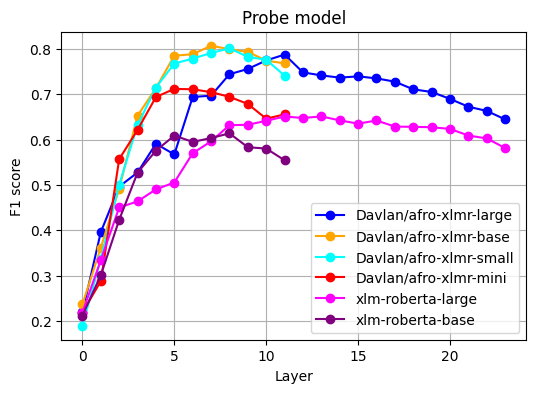

In [ ]:
results = load_results("/content/predictions/ner/probe/", "zulu", checkpoints_hidden_layer_sizes)
plot_results(results, "Probe model", "F1 score")

In [ ]:
run_training_experiments(
    checkpoints = checkpoints_hidden_layer_sizes,
    config_path = '/content/probing/probing-main/examples/config/ner_tagging.yaml',
    randomize_weights=True, task = "ner",
    lang="zulu",
    batch_size=128)


==================================Layer 1/25 of Davlan/afro-xlmr-large model==============================================================================================
/content/probing/probing-main/src
2024-09-05 04:19:37,313 - INFO - Data loaded
2024-09-05 04:19:37,314 - INFO - Train data size: 5848
2024-09-05 04:19:37,314 - INFO - Dev data size: 836
2024-09-05 04:19:37,314 - INFO - Data fields: raw_sentence, labels, sentence_len, tokens, sentence_subword_len, token_starts
/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
2024-09-05 04:19:37,413 - INFO - Loading Davlan/afro-xlmr-large with random weights.
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshootin

### Create datasets for control tasks

This function combines all the datasets in order to compute the frequency distribution of parts-of-speech labels.

In [ ]:
from collections import Counter, defaultdict
import random

def compute_pos_distribution(dataset_paths: list):
    pos_labels = []
    for path in dataset_paths:
        with open(path, 'r') as f:
            lines = f.readlines()
            for line in lines:
                if not line == '\n':
                    label = line.split('\t')[-1].strip()
                    pos_labels.append(label)  # Assuming 'upos' contains POS tags
    return Counter(pos_labels)

In [ ]:
def compute_nerrr_distribution(dataset_paths: str):
    entity_labels = []
    entities = []

    entity = ''
    entity_label = ''

    for path in dataset_paths:
        with open(path, 'r') as f:
            lines = f.readlines()
            for i in range(len(lines)):
                if not lines[i] == '\n':
                    word, label = lines[i].split('\t')
                    if label.startswith('B-'):# or line.startswith('I-'):
                        if (i + 1) < len(lines) and lines[i + 1].split('\t')[-1] == 'B-':
                            entity_labels.append(label.strip())
                            entities.append(word.strip())
                            continue
                        entity_label += ' ' + label.strip()
                        entity += ' ' + word.strip()
                    elif label.startswith('I-'):
                        entity += ' ' + word.strip()
                        entity_label += ' ' + label.strip()
                    else:
                        entities.append(word.strip())
                        entity_labels.append(label.strip())
                        if entity_label:
                            entity_labels.append(entity_label.strip())
                            entities.append(entity.strip())
                            if entity.strip().startswith('Thanda'):
                                print(entity)
                        entity = ''
                        entity_label = ''

    return set(entities), Counter(entity_labels)

In [ ]:
def compute_ner_distribution(dataset_paths):
    entities = []
    labels = []

    entity_label = ''
    tokens = ''

    for path in dataset_paths:
        with open(path, 'r') as f:
            lines = f.readlines()
            for i in range(len(lines)):
                if not lines[i] == '\n':
                    token, label = lines[i].split('\t')
                    # tokens = token
                    # entity_label = label
                    if label.startswith('O'):
                        entities.append(token.strip())
                        labels.append(label.strip())

                        if tokens:
                            entities.append(tokens.strip())
                            labels.append(entity_label.strip())
                            entity_label = ''
                            tokens = ''
                        continue
                    elif label.startswith('B-'):
                        if (i + 1) < len(lines) and (not lines[i + 1].split('\t')[-1].startswith('I-')):
                            entity_label += ' ' + label.strip()
                            tokens += ' ' + token.strip()
                            entities.append(tokens.strip())
                            labels.append(entity_label.strip())
                            entity_label = ''
                            tokens = ''
                            continue

                        tokens += ' ' + token.strip()
                        entity_label += ' ' + label.strip()

                    elif label.startswith('I-'):
                        if (i + 1) < len(lines) and (not lines[i + 1].split('\t')[-1].startswith('I-')):
                            entity_label += ' ' + label.strip()
                            tokens += ' ' + token.strip()
                            entities.append(tokens.strip())
                            labels.append(entity_label.strip())
                            entity_label = ''
                            tokens = ''
                            continue
                        entity_label += ' ' + label.strip()
                        tokens += ' ' + token.strip()
    #print(len(entities))

    return set(entities), Counter(labels)

In [ ]:
paths = ["/content/probing/probing-main/examples/data/ner_tagging/zulu/train",
         "/content/probing/probing-main/examples/data/ner_tagging/zulu/dev",
         "/content/probing/probing-main/examples/data/ner_tagging/zulu/test"]
# paths = ['/content/probing/probing-main/examples/data/ner_tagging/zulu/train_control']
entity_vocab, dist = compute_ner_distribution(paths)

### Define all the paths to the datasets

In [ ]:
paths = ["/content/probing/probing-main/examples/data/pos_tagging/zulu/train",
         "/content/probing/probing-main/examples/data/pos_tagging/zulu/dev",
         "/content/probing/probing-main/examples/data/pos_tagging/zulu/test"]
dist = compute_pos_distribution(paths)

This function builds a vocabulary for the combined datasets

In [ ]:
def build_vocabulary(dataset_paths):
    vocab = set()
    for path in dataset_paths:
        with open(path, 'r') as f:
            lines = f.readlines()
            for line in lines:
                if not line == '\n':
                    token = line.split('\t')[0].strip()
                    vocab.add(token)
    return vocab

This function uses the vocabulary along with the frequency distributions to compute the probability distribution of the parts-of-speech labels. Then control behavior is assigned to each word or token in the vocabulary by randomly drawing samples from the empirical distribution of parts-of-speech labels.

In [ ]:
def assign_random_pos_labels(vocab, pos_distribution):
    pos_tags = list(pos_distribution.keys())
    probabilities = [count / sum(pos_distribution.values()) for count in pos_distribution.values()]

    word_to_pos = {}
    # print(pos_tags)
    # print(probabilities)
    # max_index = np.argmax(probabilities)
    # label_at_max_index = pos_tags[max_index]
    # while pos_tags[max_index] == label_at_max_index:
    #     random.shuffle(pos_tags)
    # print(label_at_max_index)
    for word in vocab:
        word_to_pos[word] = random.choices(population=pos_tags, weights=probabilities)[0]
    return word_to_pos

In [ ]:
def assign_random_ner_labels(vocab, ner_distribution):
    ner_labels = list(ner_distribution.keys())
    probabilities = [count / sum(ner_distribution.values()) for count in ner_distribution.values()]

    entity_to_label = {}

    for entity in vocab:
        if entity.startswith('Thanda'):
            print(entity)
        entity_to_label[entity] = random.choices(population=ner_labels, weights=probabilities)[0]
    return entity_to_label

This function assigns labels to each word in a dataset deterministically using the control behavior specified earlier.

In [ ]:
def generate_control_labels(dataset_path, word_to_pos):

    new_dataset_path = dataset_path+"_control"
    os.makedirs(os.path.dirname(new_dataset_path), exist_ok=True)
    all_control_labels = []
    all_labels = []
    with open(new_dataset_path, 'w') as output:
        with open(dataset_path, 'r') as f:
            lines = f.readlines()
            for line in lines:
                if not line == '\n':
                    token, label = line.split('\t')
                    output.write(f"{token}\t{word_to_pos[token]}\n")
                    all_control_labels.append(word_to_pos[token])
                    all_labels.append(label)
                else:
                    output.write('\n')
    return all_control_labels, all_labels

In [ ]:
def generate_control_labels_ner(dataset_path, entity_to_label, entities):

    new_dataset_path = dataset_path+"_control"
    os.makedirs(os.path.dirname(new_dataset_path), exist_ok=True)
    all_control_labels = []
    all_labels = []
    with open(new_dataset_path, 'w') as output:
        with open(dataset_path, 'r') as f:
            for entity in entities:
                ent = entity.split(' ')
                labels = entity_to_label[entity.strip()].split(' ')

                if len(ent) == len(labels):
                    for i in range(len(ent)):
                        output.write(f"{ent[i].strip()}\t{labels[i]}\n")
                        if ent[i].endswith('\n'):
                            output.write('\n')
                elif len(ent) < len(labels):
                    for i in range(len(ent)):
                        output.write(f"{ent[i].strip()}\t{labels[i]}\n")
                        if ent[i].endswith('\n'):
                            output.write('\n')
                else:
                    for i in range(len(labels)):
                        output.write(f"{ent[i].strip()}\t{labels[i]}\n")

                    last_label = labels[i]

                    while len(ent) > len(labels):
                        output.write(f"{ent[i].strip()}\t{last_label}\n")
                        labels.append(last_label)
                        if ent[i].endswith('\n'):
                            output.write('\n')


In [ ]:
def extract_all_entities(dataset_path):
    entities = []
    tokens = ''
    with open(dataset_path, 'r') as f:
        lines = f.readlines()
        for i in range(len(lines)):
            if not lines[i] == '\n':
                token, label = lines[i].split('\t')
                if label.startswith('O'):
                    if (i + 1) < len(lines) and lines[i + 1] == '\n':
                        token += '\n'
                    entities.append(token)

                    if tokens and tokens != '\n':
                        if (i + 1) < len(lines) and lines[i + 1] == '\n':
                            tokens += '\n'
                        entities.append(tokens)
                        tokens = ''
                    continue
                elif label.startswith('B-'):
                    if (i + 1) < len(lines) and (not lines[i + 1].split('\t')[-1].startswith('I-')):
                        if lines[i + 1] == '\n':
                            tokens += ' ' + token + '\n'
                        else:
                            tokens += ' ' + token
                        entities.append(tokens.strip())
                        tokens = ''
                        continue
                    if (i + 1) < len(lines) and lines[i + 1] == '\n':
                        tokens += '\n'
                    else:
                        tokens = token
                elif label.startswith('I-'):
                    if (i + 1) < len(lines) and lines[i + 1] == '\n':
                            tokens += ' ' + token + '\n'
                    else:
                        tokens += ' ' + token
                    if (i + 1) < len(lines) and (not lines[i + 1].split('\t')[-1].startswith('I-')):
                        entities.append(tokens.strip())
                        tokens = ''
                        continue
    return entities

In [ ]:
paths = ["/content/probing/probing-main/examples/data/ner_tagging/zulu/train",
         "/content/probing/probing-main/examples/data/ner_tagging/zulu/dev",
         "/content/probing/probing-main/examples/data/ner_tagging/zulu/test"]
entity_vocab, dist = compute_ner_distribution(paths)
entity_to_label = assign_random_ner_labels(entity_vocab, dist)
ent = extract_all_entities("/content/probing/probing-main/examples/data/ner_tagging/zulu/dev")
ent = extract_all_entities("/content/probing/probing-main/examples/data/ner_tagging/zulu/train")

Thanda Mnikaziwempuphu Chonco
Thanda ChoncoeGoli
Thandani Ntshumayelo
Thanda Mnikaziwempuphu


In [ ]:
generate_control_labels_ner(paths[1], entity_to_label, ent)

In [ ]:
random.seed(2)
pos_distribution = compute_pos_distribution(paths)
vocab = build_vocabulary(paths)
word_to_pos = assign_random_pos_labels(vocab, pos_distribution)
training_dataset_with_control, ground_labels = generate_control_labels(paths[0], word_to_pos)
_, _ = generate_control_labels(paths[1], word_to_pos)
#test_dataset_with_control = generate_control_labels(paths[2], word_to_pos)

## Plot the distribution of parts-of-speech labels in the train dataset after control behavior is implemented.

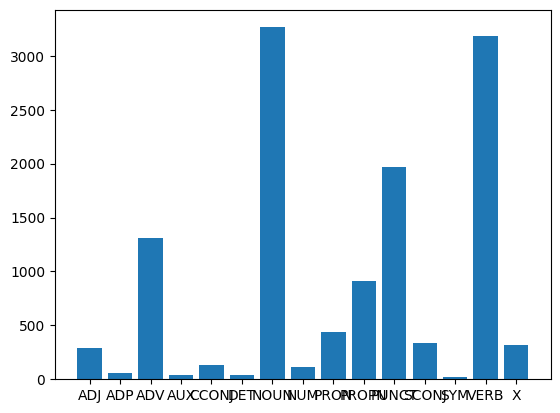

In [ ]:
unique_val_pos, counts = np.unique(training_dataset_with_control, return_counts=True)
plt.bar(unique_val_pos, counts)
plt.xticks(unique_val_pos)
plt.show()

## Plot the distribution of parts-of-speech labels before control behavior is impplemented.

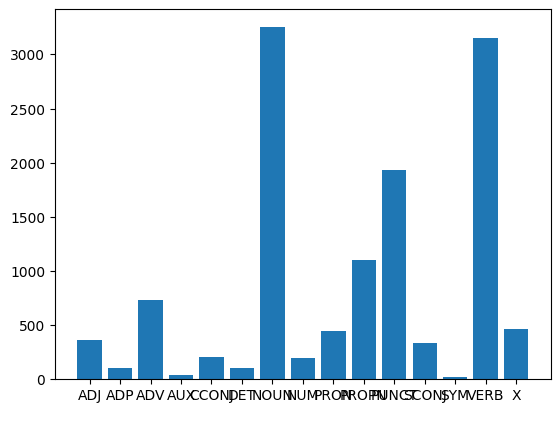

In [ ]:
unique_val_pos, counts = np.unique(ground_labels, return_counts=True)
plt.bar(unique_val_pos, counts)
plt.xticks(unique_val_pos)
plt.show()

## Empirical distribution of parts-of-speech labels for the combined dataset.

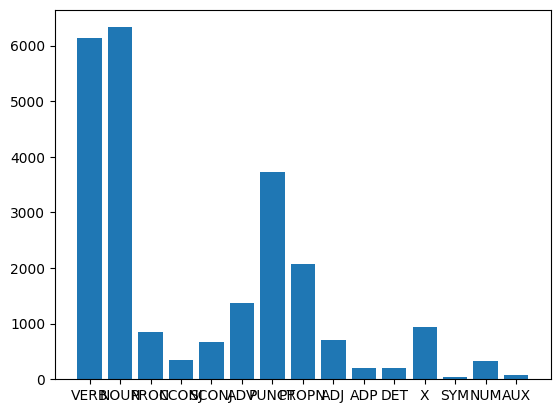

In [ ]:
plt.bar(pos_distribution.keys(), pos_distribution.values())
plt.xticks(list(pos_distribution.keys()))
plt.show()

In [ ]:
sum(counts)

12419

In [ ]:
sum(pos_distribution.values())

24027

In [ ]:
_, _, = generate_control_labels(paths[2], word_to_pos)

## News Topic Classification

In [ ]:
class NewsTopicDataset(torch.utils.data.Dataset):
  def __init__(self, embeddings, labels):
    self.embeddings = embeddings
    self.labels = labels

  def __len__(self):
    return len(self.labels)

  def __getitem__(self, idx):
    item = torch.tensor(self.embeddings[idx])#.clone().detach()
    label = torch.tensor(self.labels[idx])
    #print(label)
    return item, label

In [ ]:
class NewsTopicProbe(nn.Module):
    def __init__(self, input_dim, output_dim):
        super().__init__()
        # self.linear = nn.Linear(input_dim, output_dim)
        self.model = nn.Sequential(
          nn.Linear(input_dim, 100),
          nn.BatchNorm1d(100),
          nn.Dropout(0.2),
          nn.ReLU(),
          nn.Linear(100, 50),
          nn.BatchNorm1d(50),
          nn.Dropout(0.2),
          nn.ReLU(),
          nn.Linear(50, output_dim)
        )

    def forward(self, x):
        #return self.linear(x)
        return self.model(x)

In [ ]:
import datasets

def get_cls_embeddings_and_labels(model: AutoModel, tokenizer: AutoTokenizer, dataset: datasets.arrow_dataset.Dataset, batch_size)->list:

    layer_embeddings = {}
    labels = []
    texts = [sample['text'] for sample in dataset]
    labels = [sample['label'] for sample in dataset]
    num_samples = len(texts)
    start = 0
    end = 0

    while end < num_samples:
        end = start + batch_size
        texts_batch = texts[start:end]
        start = end
        inputs = tokenizer(texts_batch, return_tensors="pt", truncation = True, padding="longest").to(device)

        with torch.no_grad():
            output = model(**inputs)

        num_layers = len(output.hidden_states)

        for layer in range(1, num_layers):
            embeddings = layer_embeddings.get(layer, [])
            embeddings.extend(output.hidden_states[layer][:, 0, :].tolist())
            layer_embeddings[layer] = embeddings
    # print(f"Label size: {len(labels)}")
    # print(f"Embedding size: {len(list(layer_embeddings[1]))}")
    assert len(labels) == len(list(layer_embeddings[1]))

    return layer_embeddings, labels

In [ ]:
import copy

def train_probe_classifier1(probe_classifier: nn.Module,
                            train_dataloader: DataLoader,
                            val_dataloader: DataLoader,
                            epochs: int = 101,
                            patience: int = 10) -> list:

    criterion = nn.CrossEntropyLoss().to(device)
    optimizer = optim.Adam(probe_classifier.parameters(), lr=1e-5)
    # scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.1)

    best_val_loss = float('inf')
    epochs_without_improvement = 0
    evals = []
    models = []

    # Training loop
    for epoch in range(epochs):
        losses = 0.0
        num_correct_predictions = 0
        num_correct_val_predictions = 0
        probe_classifier.train()

        for inputs, labels in train_dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = probe_classifier(inputs)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()
            losses += loss.item()

            predictions = torch.argmax(outputs, dim=1)
            num_correct_predictions += (labels == predictions).sum().item()
        epoch_loss = losses / len(train_dataloader)
        accuracy = num_correct_predictions / len(train_dataloader.dataset)

        # Validation
        probe_classifier.eval()
        val_loss = 0.0
        with torch.no_grad():
            for val_input, val_labels in val_dataloader:
                val_input = val_input.to(device)
                val_labels = val_labels.to(device)

                outputs = probe_classifier(val_input)

                loss = criterion(outputs, val_labels)
                val_loss += loss.item()

                predictions = torch.argmax(outputs, dim=1)
                num_correct_val_predictions += (val_labels == predictions).sum().item()

        val_accuracy = num_correct_val_predictions / len(val_dataloader.dataset)
        val_loss /= len(val_dataloader)

        if epoch % 50 == 0:
            print(f"Epoch {epoch+1}/{epochs}, Loss: {epoch_loss:.4f}, Accuracy: {accuracy:.4f}, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}")

        # scheduler.step()
        # Check for early stopping
        if round(val_loss, 2) < round(best_val_loss, 2):
            best_val_loss = val_loss
            epochs_without_improvement = 0
        else:
            epochs_without_improvement += 1

        if epochs_without_improvement >= patience:
            print(f"Epoch {epoch+1}/{epochs}, Loss: {epoch_loss:.4f}, Accuracy: {accuracy:.4f}, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}")
            print(f"Early stopping at epoch {epoch+1} due to no improvement in validation loss for {patience} consecutive epochs.")
            break

        evals.append(val_accuracy)
        models.append(copy.deepcopy(probe_classifier))

    print("Training complete.")
    best_val_accuracy_idx = evals.index(max(evals))
    model = models[best_val_accuracy_idx]
    best_val_accuracy = evals[best_val_accuracy_idx]
    print(f"Best validation accuracy: {best_val_accuracy}")

    return epoch, epoch_loss, accuracy, best_val_loss, best_val_accuracy, model

In [ ]:
def inference(model: nn.Module, dataloader: DataLoader):
    model.eval()

    num_correct_val_predictions = 0

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            predictions = torch.argmax(outputs, dim=1)
            num_correct_val_predictions += (labels == predictions).sum().item()

        accuracy = num_correct_val_predictions / len(dataloader.dataset)

    return accuracy

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
tokenizer = AutoTokenizer.from_pretrained("Davlan/afro-xlmr-large", padding = True, truncation = True)
model = AutoModel.from_pretrained("Davlan/afro-xlmr-large", output_hidden_states=True)
model.to(device)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
Some weights of XLMRobertaModel were not initialized from the model checkpoint at Davlan/afro-xlmr-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


XLMRobertaModel(
  (embeddings): XLMRobertaEmbeddings(
    (word_embeddings): Embedding(250002, 1024, padding_idx=1)
    (position_embeddings): Embedding(514, 1024, padding_idx=1)
    (token_type_embeddings): Embedding(1, 1024)
    (LayerNorm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): XLMRobertaEncoder(
    (layer): ModuleList(
      (0-23): 24 x XLMRobertaLayer(
        (attention): XLMRobertaAttention(
          (self): XLMRobertaSelfAttention(
            (query): Linear(in_features=1024, out_features=1024, bias=True)
            (key): Linear(in_features=1024, out_features=1024, bias=True)
            (value): Linear(in_features=1024, out_features=1024, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): XLMRobertaSelfOutput(
            (dense): Linear(in_features=1024, out_features=1024, bias=True)
            (LayerNorm): LayerNorm((1024,), eps=1e-05, elementwi

In [ ]:
def download_dataset(lang: str, repo_id: str = "masakhane/masakhanews") -> list:
    REPO_ID = "masakhane/masakhanews"
# FILENAME = "data.csv"

    train = load_dataset(REPO_ID, name=lang, split="train")
    test = load_dataset(REPO_ID, name=lang, split="test")
    val = load_dataset(REPO_ID, name=lang, split="validation")
    return train, test, val

## Create dataloaders

In [ ]:
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=32, shuffle=False)

In [ ]:
chk = ["Davlan/afro-xlmr-large", "Davlan/afro-xlmr-base", "xlm-roberta-large", "xlm-roberta-base"]
checkpoints_dict = {chk[0]: (1024, 25), chk[1]: (768, 13), chk[2]: (1024, 25), chk[3]: (768, 13)}

In [ ]:
evals = {}

## Train probes for each layer of each model

In [ ]:
def train_models(checkpoints_dict: dict, train: Dataset, val: Dataset, test: Dataset):
    evals = {}
    for checkpoint, hidden_dim in checkpoints_dict.items():
        model, tokenizer = get_models_and_tokenizers(checkpoint)
        # tokenizer = AutoTokenizer.from_pretrained(checkpoint, padding = True)
        # model = AutoModel.from_pretrained(checkpoint, output_hidden_states=True)
        model.to(device)

        train_embeddings, train_labels = get_cls_embeddings_and_labels(model, tokenizer, train, 2)
        val_embeddings, val_labels = get_cls_embeddings_and_labels(model, tokenizer, val, 2)
        test_embeddings, test_labels = get_cls_embeddings_and_labels(model, tokenizer, test, 2)

        print(f"========================================Model: {checkpoint}=================================================")
        for layer in range(1, hidden_dim[0]):
            print(f"Layer: {layer}/{hidden_dim[0] - 1}")
            train_dataset = NewsTopicDataset(train_embeddings[layer], train_labels)
            val_dataset = NewsTopicDataset(val_embeddings[layer], val_labels)
            test_dataset = NewsTopicDataset(test_embeddings[layer], test_labels)

            train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
            val_dataloader = DataLoader(val_dataset, batch_size=32, shuffle=False)
            test_dataloader = DataLoader(test_dataset, batch_size=32, shuffle=False)

            news_topic_classifier = NewsTopicProbe(hidden_dim[1], 7).to(device)
            _, _, _, _, _, model = train_probe_classifier1(news_topic_classifier, train_dataloader, val_dataloader, epochs = 200)
            accs = evals.get(checkpoint, [])
            accs.append(inference(model, test_dataloader))
            evals[checkpoint] = accs
            print()
            #print(f"Accuracy: {inference(model, test_dataloader)}")
        print(f"==============================================================================================================")
        print()
    return evals
            #evals[checkpoint] = inference(model, test_dataloader)

In [ ]:
def write_results(lang: str, test_results: str, task: str = 'news_topic_classification', baseline: bool = False):
    task_type = 'probe'
    if baseline:
        task_type = "baseline"

    for model_name, results in test_results.items():
        results_path = f"/content/predictions/{task}/{lang}/{task_type}/{model_name}/results.txt"
        os.makedirs(os.path.dirname(results_path), exist_ok=True)
        with open(results_path, 'w') as f:
            for result in results:
               f.write(f"{result}\n")

### News topic classification for Swahili

In [ ]:
train, test, val = download_dataset("swa")
# model, tokenizer = get_models_and_tokenizers('castorini/afriberta_large')#AutoTokenizer.from_pretrained('castorini/afriberta_large', padding = True)
# #model = AutoModel.from_pretrained('castorini/afriberta_large', output_hidden_states=True)
# model.to(device)
# train_embeddings, train_labels = get_cls_embeddings_and_labels(model, tokenizer, train, 32)
# val_embeddings, val_labels = get_cls_embeddings_and_labels(model, tokenizer, val, 32)
# test_embeddings, test_labels = get_cls_embeddings_and_labels(model, tokenizer, test, 32)

In [ ]:
checkpoints_hidden_layer_sizes

{'castorini/afriberta_large': (11, 768),
 'Davlan/afro-xlmr-large': (25, 1024),
 'Davlan/afro-xlmr-base': (13, 768),
 'bonadossou/afrolm_active_learning': (11, 768),
 'xlm-roberta-large': (25, 1024),
 'xlm-roberta-base': (13, 768),
 'francois-meyer/nguni-xlmr-large': (25, 1024)}

In [ ]:
test_results = train_models(checkpoints_dict=checkpoints_hidden_layer_sizes, train=train, val=val, test=test)

========================================Model: Davlan/afro-xlmr-large=================================================
Layer: 1/24
Epoch 1/200, Loss: 1.9358, Accuracy: 0.2189, Val Loss: 1.9068, Val Accuracy: 0.2110
Epoch 51/200, Loss: 1.3436, Accuracy: 0.5712, Val Loss: 1.4786, Val Accuracy: 0.5232
Epoch 101/200, Loss: 1.0672, Accuracy: 0.6984, Val Loss: 1.3078, Val Accuracy: 0.6034
Epoch 151/200, Loss: 0.8550, Accuracy: 0.7696, Val Loss: 1.1879, Val Accuracy: 0.6245
Training complete.
Best validation accuracy: 0.6455696202531646

Layer: 2/24
Epoch 1/200, Loss: 2.0212, Accuracy: 0.1441, Val Loss: 1.9447, Val Accuracy: 0.2025
Epoch 51/200, Loss: 1.1554, Accuracy: 0.6628, Val Loss: 1.2199, Val Accuracy: 0.6076
Epoch 101/200, Loss: 0.8735, Accuracy: 0.7684, Val Loss: 0.9932, Val Accuracy: 0.7131
Epoch 151/200, Loss: 0.6829, Accuracy: 0.8456, Val Loss: 0.8790, Val Accuracy: 0.7215
Epoch 165/200, Loss: 0.6263, Accuracy: 0.8510, Val Loss: 0.8650, Val Accuracy: 0.7215
Early stopping at epoch 

Some weights of XLMRobertaForTokenClassification were not initialized from the model checkpoint at castorini/afriberta_large and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


========================================Model: castorini/afriberta_large=================================================
Layer: 1/10
Epoch 1/200, Loss: 1.8577, Accuracy: 0.2702, Val Loss: 1.9104, Val Accuracy: 0.2110
Epoch 51/200, Loss: 1.0639, Accuracy: 0.7093, Val Loss: 1.1077, Val Accuracy: 0.6793
Epoch 101/200, Loss: 0.8459, Accuracy: 0.7817, Val Loss: 0.8734, Val Accuracy: 0.7511
Epoch 151/200, Loss: 0.7136, Accuracy: 0.8064, Val Loss: 0.7644, Val Accuracy: 0.7890
Epoch 180/200, Loss: 0.6365, Accuracy: 0.8305, Val Loss: 0.7220, Val Accuracy: 0.7848
Early stopping at epoch 180 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.8016877637130801

Layer: 2/10
Epoch 1/200, Loss: 1.9341, Accuracy: 0.1930, Val Loss: 1.9288, Val Accuracy: 0.2110
Epoch 51/200, Loss: 0.9850, Accuracy: 0.7443, Val Loss: 0.9989, Val Accuracy: 0.7300
Epoch 101/200, Loss: 0.7567, Accuracy: 0.8106, Val Loss: 0.8039, Val Accuracy: 0.7764
Epoch 151/2

Some weights of XLMRobertaModel were not initialized from the model checkpoint at bonadossou/afrolm_active_learning and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


========================================Model: bonadossou/afrolm_active_learning=================================================
Layer: 1/10
Epoch 1/200, Loss: 1.9563, Accuracy: 0.1930, Val Loss: 1.9629, Val Accuracy: 0.2194
Epoch 51/200, Loss: 1.2484, Accuracy: 0.6218, Val Loss: 1.3238, Val Accuracy: 0.5992
Epoch 101/200, Loss: 0.9895, Accuracy: 0.7159, Val Loss: 1.1640, Val Accuracy: 0.6203
Epoch 151/200, Loss: 0.8273, Accuracy: 0.7690, Val Loss: 1.0744, Val Accuracy: 0.6160
Epoch 156/200, Loss: 0.8191, Accuracy: 0.7636, Val Loss: 1.0662, Val Accuracy: 0.6329
Early stopping at epoch 156 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.6413502109704642

Layer: 2/10
Epoch 1/200, Loss: 1.9638, Accuracy: 0.1647, Val Loss: 1.9340, Val Accuracy: 0.1730
Epoch 51/200, Loss: 1.2389, Accuracy: 0.6098, Val Loss: 1.3009, Val Accuracy: 0.5992
Epoch 101/200, Loss: 1.0047, Accuracy: 0.6978, Val Loss: 1.1344, Val Accuracy: 0.6624
Epo

### Write and Plot the results Swahili

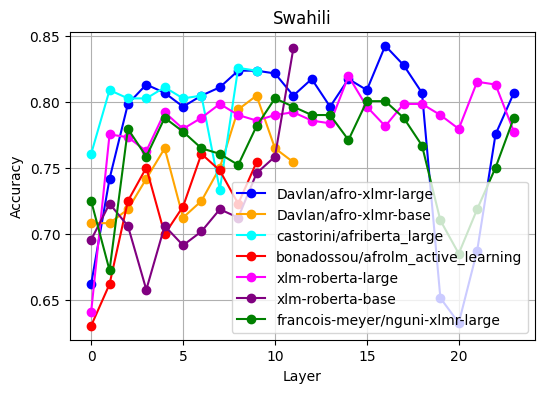

In [ ]:
write_results("swa", test_results)
plot_results(test_results, "Swahili", "Accuracy")

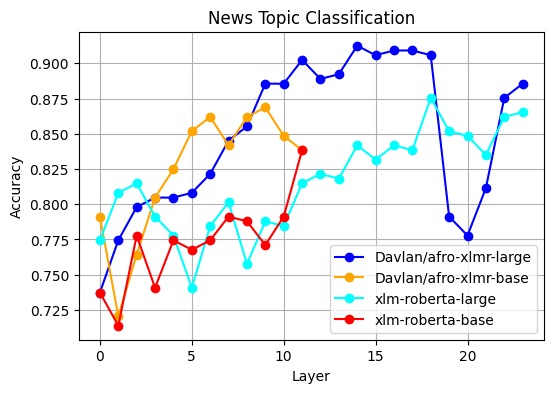

In [ ]:
plot_results(evals, "News Topic Classification", "Accuracy")

### News topic classification for isiXhosa

In [ ]:
train, test, val = download_dataset("xho")

In [ ]:
isiXhosa_test_results = train_models(checkpoints_dict=checkpoints_hidden_layer_sizes, train=train, val=val, test=test)

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


========================================Model: Davlan/afro-xlmr-large=================================================
Layer: 1/24
Epoch 1/200, Loss: 1.9452, Accuracy: 0.2045, Val Loss: 1.9598, Val Accuracy: 0.1088
Epoch 51/200, Loss: 1.2517, Accuracy: 0.7141, Val Loss: 1.3156, Val Accuracy: 0.6735
Epoch 101/200, Loss: 0.9388, Accuracy: 0.7936, Val Loss: 1.0170, Val Accuracy: 0.7007
Epoch 151/200, Loss: 0.7306, Accuracy: 0.8266, Val Loss: 0.8895, Val Accuracy: 0.7075
Epoch 173/200, Loss: 0.6505, Accuracy: 0.8440, Val Loss: 0.8586, Val Accuracy: 0.7211
Early stopping at epoch 173 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.7346938775510204

Layer: 2/24
Epoch 1/200, Loss: 2.2025, Accuracy: 0.0649, Val Loss: 2.0610, Val Accuracy: 0.0000
Epoch 51/200, Loss: 1.3855, Accuracy: 0.6492, Val Loss: 1.4527, Val Accuracy: 0.6327
Epoch 101/200, Loss: 1.0036, Accuracy: 0.8004, Val Loss: 1.1187, Val Accuracy: 0.7415
Epoch 151/200,

/usr/local/lib/python3.10/dist-packages/transformers/convert_slow_tokenizer.py:551: UserWarning: The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.
  warnings.warn(
Some weights of XLMRobertaForTokenClassification were not initialized from the model checkpoint at castorini/afriberta_large and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


========================================Model: castorini/afriberta_large=================================================
Layer: 1/10
Epoch 1/200, Loss: 1.9793, Accuracy: 0.1434, Val Loss: 1.9943, Val Accuracy: 0.0000
Epoch 51/200, Loss: 1.2510, Accuracy: 0.6996, Val Loss: 1.2629, Val Accuracy: 0.7279
Epoch 101/200, Loss: 0.9241, Accuracy: 0.7955, Val Loss: 0.9948, Val Accuracy: 0.7891
Epoch 151/200, Loss: 0.7338, Accuracy: 0.8188, Val Loss: 0.8462, Val Accuracy: 0.8027
Epoch 181/200, Loss: 0.6807, Accuracy: 0.8256, Val Loss: 0.7786, Val Accuracy: 0.7959
Early stopping at epoch 181 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.8095238095238095

Layer: 2/10
Epoch 1/200, Loss: 1.9646, Accuracy: 0.1696, Val Loss: 1.9069, Val Accuracy: 0.2109
Epoch 51/200, Loss: 1.1576, Accuracy: 0.7384, Val Loss: 1.1772, Val Accuracy: 0.7211
Epoch 101/200, Loss: 0.8492, Accuracy: 0.8101, Val Loss: 0.9016, Val Accuracy: 0.7483
Epoch 151/2

Some weights of XLMRobertaModel were not initialized from the model checkpoint at bonadossou/afrolm_active_learning and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


========================================Model: bonadossou/afrolm_active_learning=================================================
Layer: 1/10
Epoch 1/200, Loss: 1.8885, Accuracy: 0.2287, Val Loss: 1.9382, Val Accuracy: 0.3333
Epoch 51/200, Loss: 1.1910, Accuracy: 0.7035, Val Loss: 1.1988, Val Accuracy: 0.7415
Epoch 101/200, Loss: 0.9189, Accuracy: 0.7839, Val Loss: 0.9468, Val Accuracy: 0.7959
Epoch 151/200, Loss: 0.7140, Accuracy: 0.8236, Val Loss: 0.8079, Val Accuracy: 0.8027
Epoch 181/200, Loss: 0.6075, Accuracy: 0.8547, Val Loss: 0.7553, Val Accuracy: 0.8027
Early stopping at epoch 181 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.8231292517006803

Layer: 2/10
Epoch 1/200, Loss: 2.0311, Accuracy: 0.1395, Val Loss: 2.0281, Val Accuracy: 0.0680
Epoch 51/200, Loss: 1.1242, Accuracy: 0.7355, Val Loss: 1.1502, Val Accuracy: 0.7551
Epoch 101/200, Loss: 0.8380, Accuracy: 0.7907, Val Loss: 0.9063, Val Accuracy: 0.7823
Epo

### Write and plot results for isiXhosa

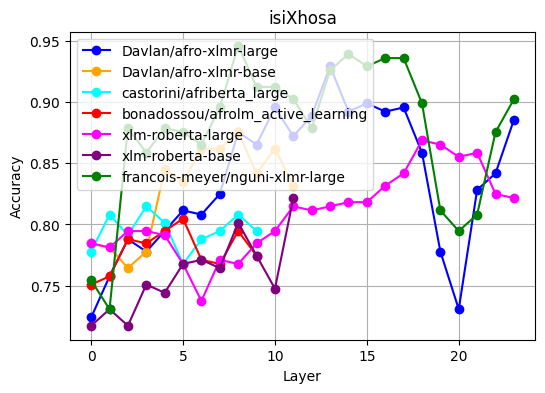

In [ ]:
write_results("xho", isiXhosa_test_results)
plot_results(isiXhosa_test_results, "isiXhosa", "Accuracy")

### News topic classification for Hausa

In [ ]:
train, val, test = download_dataset('hau')

Generating train split:   0%|          | 0/2219 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/317 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/637 [00:00<?, ? examples/s]

In [ ]:
isiXhosa_test_results = train_models(checkpoints_dict=checkpoints_hidden_layer_sizes, train=train, val=val, test=test)

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


========================================Model: Davlan/afro-xlmr-large=================================================
Layer: 1/24
Epoch 1/200, Loss: 1.9506, Accuracy: 0.1965, Val Loss: 1.9034, Val Accuracy: 0.2119
Epoch 51/200, Loss: 1.2546, Accuracy: 0.6323, Val Loss: 1.3121, Val Accuracy: 0.6091
Epoch 101/200, Loss: 0.9258, Accuracy: 0.7521, Val Loss: 1.0601, Val Accuracy: 0.6797
Epoch 151/200, Loss: 0.6930, Accuracy: 0.8351, Val Loss: 0.9165, Val Accuracy: 0.7221
Training complete.
Best validation accuracy: 0.7346938775510204

Layer: 2/24
Epoch 1/200, Loss: 2.0178, Accuracy: 0.1505, Val Loss: 1.9433, Val Accuracy: 0.1586
Epoch 51/200, Loss: 1.2015, Accuracy: 0.6769, Val Loss: 1.2626, Val Accuracy: 0.6327
Epoch 101/200, Loss: 0.8756, Accuracy: 0.7823, Val Loss: 0.9880, Val Accuracy: 0.7206
Epoch 151/200, Loss: 0.6480, Accuracy: 0.8481, Val Loss: 0.8338, Val Accuracy: 0.7488
Training complete.
Best validation accuracy: 0.7708006279434851

Layer: 3/24
Epoch 1/200, Loss: 1.9487, Accura

/usr/local/lib/python3.10/dist-packages/transformers/convert_slow_tokenizer.py:551: UserWarning: The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.
  warnings.warn(
Some weights of XLMRobertaForTokenClassification were not initialized from the model checkpoint at castorini/afriberta_large and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


========================================Model: castorini/afriberta_large=================================================
Layer: 1/10
Epoch 1/200, Loss: 1.9659, Accuracy: 0.1717, Val Loss: 1.9318, Val Accuracy: 0.1884
Epoch 51/200, Loss: 0.9392, Accuracy: 0.7657, Val Loss: 0.9623, Val Accuracy: 0.7457
Epoch 101/200, Loss: 0.6705, Accuracy: 0.8436, Val Loss: 0.7219, Val Accuracy: 0.8085
Epoch 151/200, Loss: 0.5346, Accuracy: 0.8680, Val Loss: 0.6013, Val Accuracy: 0.8305
Epoch 184/200, Loss: 0.4486, Accuracy: 0.8860, Val Loss: 0.5667, Val Accuracy: 0.8352
Early stopping at epoch 184 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.8508634222919937

Layer: 2/10
Epoch 1/200, Loss: 1.9507, Accuracy: 0.1731, Val Loss: 1.9232, Val Accuracy: 0.1900
Epoch 51/200, Loss: 0.8822, Accuracy: 0.8238, Val Loss: 0.8974, Val Accuracy: 0.7943
Epoch 101/200, Loss: 0.6059, Accuracy: 0.8752, Val Loss: 0.6416, Val Accuracy: 0.8477
Epoch 151/2

Some weights of XLMRobertaModel were not initialized from the model checkpoint at bonadossou/afrolm_active_learning and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


========================================Model: bonadossou/afrolm_active_learning=================================================
Layer: 1/10
Epoch 1/200, Loss: 1.9356, Accuracy: 0.1987, Val Loss: 1.9057, Val Accuracy: 0.1931
Epoch 51/200, Loss: 0.9264, Accuracy: 0.7805, Val Loss: 0.9750, Val Accuracy: 0.7457
Epoch 101/200, Loss: 0.6526, Accuracy: 0.8526, Val Loss: 0.7640, Val Accuracy: 0.7881
Epoch 141/200, Loss: 0.5183, Accuracy: 0.8873, Val Loss: 0.6620, Val Accuracy: 0.7991
Early stopping at epoch 141 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.8037676609105181

Layer: 2/10
Epoch 1/200, Loss: 1.9327, Accuracy: 0.1870, Val Loss: 1.8857, Val Accuracy: 0.2418
Epoch 51/200, Loss: 0.9082, Accuracy: 0.7688, Val Loss: 1.0032, Val Accuracy: 0.7410
Epoch 101/200, Loss: 0.6622, Accuracy: 0.8409, Val Loss: 0.7783, Val Accuracy: 0.7849
Epoch 150/200, Loss: 0.4950, Accuracy: 0.8801, Val Loss: 0.6869, Val Accuracy: 0.7928
Ear

### Write and plot results for Hausa

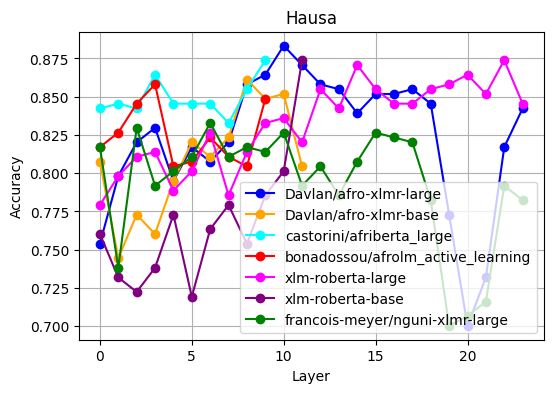

In [ ]:
write_results("hau", isiXhosa_test_results)
plot_results(isiXhosa_test_results, "Hausa", "Accuracy")

In [ ]:
!zip -r zipfile.zip /content/predictions -x .*

updating: content/predictions/ (stored 0%)
updating: content/predictions/random_probe/ (stored 0%)
updating: content/predictions/random_probe/zulu/ (stored 0%)
updating: content/predictions/random_probe/zulu/xlm-roberta-large/ (stored 0%)
updating: content/predictions/random_probe/zulu/xlm-roberta-large/results.txt (deflated 68%)
updating: content/predictions/random_probe/zulu/xlm-roberta-large/preds.txt (deflated 73%)
updating: content/predictions/random_probe/zulu/Davlan/ (stored 0%)
updating: content/predictions/random_probe/zulu/Davlan/afro-xlmr-mini/ (stored 0%)
updating: content/predictions/random_probe/zulu/Davlan/afro-xlmr-mini/results.txt (deflated 65%)
updating: content/predictions/random_probe/zulu/Davlan/afro-xlmr-mini/preds.txt (deflated 74%)
updating: content/predictions/random_probe/zulu/Davlan/afro-xlmr-base/ (stored 0%)
updating: content/predictions/random_probe/zulu/Davlan/afro-xlmr-base/results.txt (deflated 62%)
updating: content/predictions/random_probe/zulu/Davlan

### News topic classification for Luganda

In [ ]:
train, val, test = download_dataset('lug')

Generating train split:   0%|          | 0/771 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/110 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/223 [00:00<?, ? examples/s]

In [ ]:
test_results = train_models(checkpoints_dict=checkpoints_hidden_layer_sizes, train=train, val=val, test=test)

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


========================================Model: Davlan/afro-xlmr-large=================================================
Layer: 1/24
Epoch 1/200, Loss: 2.0387, Accuracy: 0.1466, Val Loss: 1.9661, Val Accuracy: 0.0897
Epoch 50/200, Loss: 1.6013, Accuracy: 0.4968, Val Loss: 1.7760, Val Accuracy: 0.3363
Early stopping at epoch 50 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.3632286995515695

Layer: 2/24
Epoch 1/200, Loss: 2.0260, Accuracy: 0.1336, Val Loss: 1.8988, Val Accuracy: 0.2063
Epoch 12/200, Loss: 1.8965, Accuracy: 0.2438, Val Loss: 1.8917, Val Accuracy: 0.2646
Early stopping at epoch 12 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.23318385650224216

Layer: 3/24
Epoch 1/200, Loss: 2.1255, Accuracy: 0.0830, Val Loss: 1.9038, Val Accuracy: 0.4215
Epoch 11/200, Loss: 1.9226, Accuracy: 0.2114, Val Loss: 1.9381, Val Accuracy: 0.2063
Early stopping at

/usr/local/lib/python3.10/dist-packages/transformers/convert_slow_tokenizer.py:551: UserWarning: The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.
  warnings.warn(
Some weights of XLMRobertaForTokenClassification were not initialized from the model checkpoint at castorini/afriberta_large and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


========================================Model: castorini/afriberta_large=================================================
Layer: 1/10
Epoch 1/200, Loss: 1.9602, Accuracy: 0.1686, Val Loss: 1.9164, Val Accuracy: 0.2063
Epoch 51/200, Loss: 1.4493, Accuracy: 0.5123, Val Loss: 1.5595, Val Accuracy: 0.5426
Epoch 95/200, Loss: 1.2361, Accuracy: 0.6291, Val Loss: 1.4161, Val Accuracy: 0.5426
Early stopping at epoch 95 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.5560538116591929

Layer: 2/10
Epoch 1/200, Loss: 2.2780, Accuracy: 0.0571, Val Loss: 2.1029, Val Accuracy: 0.0000
Epoch 11/200, Loss: 2.1101, Accuracy: 0.1115, Val Loss: 2.1120, Val Accuracy: 0.0987
Early stopping at epoch 11 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.10762331838565023

Layer: 3/10
Epoch 1/200, Loss: 1.9034, Accuracy: 0.2477, Val Loss: 1.8812, Val Accuracy: 0.4484
Epoch 51/200, 

Some weights of XLMRobertaModel were not initialized from the model checkpoint at bonadossou/afrolm_active_learning and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


========================================Model: bonadossou/afrolm_active_learning=================================================
Layer: 1/10
Epoch 1/200, Loss: 1.9563, Accuracy: 0.1764, Val Loss: 1.9751, Val Accuracy: 0.0000
Epoch 51/200, Loss: 1.5448, Accuracy: 0.5227, Val Loss: 1.5583, Val Accuracy: 0.4843
Epoch 101/200, Loss: 1.2268, Accuracy: 0.6485, Val Loss: 1.3968, Val Accuracy: 0.5874
Epoch 114/200, Loss: 1.2107, Accuracy: 0.6394, Val Loss: 1.3610, Val Accuracy: 0.5964
Early stopping at epoch 114 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.5964125560538116

Layer: 2/10
Epoch 1/200, Loss: 1.9888, Accuracy: 0.2231, Val Loss: 1.9072, Val Accuracy: 0.4126
Epoch 51/200, Loss: 1.5466, Accuracy: 0.5227, Val Loss: 1.6063, Val Accuracy: 0.5022
Epoch 101/200, Loss: 1.2785, Accuracy: 0.6407, Val Loss: 1.4289, Val Accuracy: 0.5695
Epoch 140/200, Loss: 1.1355, Accuracy: 0.6900, Val Loss: 1.3625, Val Accuracy: 0.5605
Ear

### Write and plot resutls for Luganda

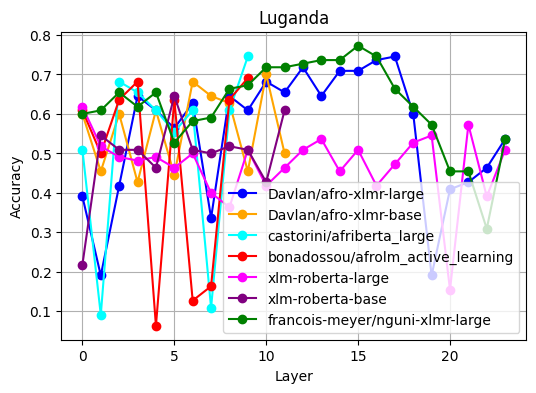

In [ ]:
write_results("lug", test_results)
plot_results(test_results, "Luganda", "Accuracy")

### News topic classification for Naija Pidgin

In [ ]:
train, val, test = download_dataset('pcm')

Generating train split:   0%|          | 0/1060 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/152 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/305 [00:00<?, ? examples/s]

In [ ]:
test_results = train_models(checkpoints_dict=checkpoints_hidden_layer_sizes, train=train, val=val, test=test)

========================================Model: Davlan/afro-xlmr-large=================================================
Layer: 1/24
Epoch 1/200, Loss: 2.0531, Accuracy: 0.1415, Val Loss: 1.9824, Val Accuracy: 0.1115
Epoch 51/200, Loss: 1.3432, Accuracy: 0.6991, Val Loss: 1.3691, Val Accuracy: 0.6787
Epoch 101/200, Loss: 0.9614, Accuracy: 0.8226, Val Loss: 1.0669, Val Accuracy: 0.7705
Epoch 151/200, Loss: 0.7229, Accuracy: 0.8774, Val Loss: 0.8802, Val Accuracy: 0.8033
Training complete.
Best validation accuracy: 0.819672131147541

Layer: 2/24
Epoch 1/200, Loss: 2.1118, Accuracy: 0.0783, Val Loss: 2.0508, Val Accuracy: 0.0492
Epoch 51/200, Loss: 1.1603, Accuracy: 0.7915, Val Loss: 1.1763, Val Accuracy: 0.7967
Epoch 101/200, Loss: 0.7884, Accuracy: 0.8670, Val Loss: 0.8505, Val Accuracy: 0.8426
Epoch 140/200, Loss: 0.6275, Accuracy: 0.9019, Val Loss: 0.7080, Val Accuracy: 0.8393
Early stopping at epoch 140 due to no improvement in validation loss for 10 consecutive epochs.
Training comple

Some weights of XLMRobertaForTokenClassification were not initialized from the model checkpoint at castorini/afriberta_large and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


========================================Model: castorini/afriberta_large=================================================
Layer: 1/10
Epoch 1/200, Loss: 1.9440, Accuracy: 0.2057, Val Loss: 1.8548, Val Accuracy: 0.3016
Epoch 51/200, Loss: 0.9841, Accuracy: 0.8189, Val Loss: 0.9589, Val Accuracy: 0.8230
Epoch 101/200, Loss: 0.7149, Accuracy: 0.8887, Val Loss: 0.7143, Val Accuracy: 0.8754
Epoch 151/200, Loss: 0.5393, Accuracy: 0.9170, Val Loss: 0.5524, Val Accuracy: 0.8885
Training complete.
Best validation accuracy: 0.9049180327868852

Layer: 2/10
Epoch 1/200, Loss: 1.9470, Accuracy: 0.2085, Val Loss: 1.9463, Val Accuracy: 0.3016
Epoch 51/200, Loss: 0.9229, Accuracy: 0.8632, Val Loss: 0.9287, Val Accuracy: 0.8590
Epoch 101/200, Loss: 0.6414, Accuracy: 0.9066, Val Loss: 0.6315, Val Accuracy: 0.8951
Epoch 151/200, Loss: 0.4942, Accuracy: 0.9283, Val Loss: 0.4767, Val Accuracy: 0.9213
Epoch 183/200, Loss: 0.3990, Accuracy: 0.9481, Val Loss: 0.4252, Val Accuracy: 0.9148
Early stopping at epo

Some weights of XLMRobertaModel were not initialized from the model checkpoint at bonadossou/afrolm_active_learning and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


========================================Model: bonadossou/afrolm_active_learning=================================================
Layer: 1/10
Epoch 1/200, Loss: 2.0387, Accuracy: 0.0896, Val Loss: 2.0131, Val Accuracy: 0.0000
Epoch 51/200, Loss: 1.1385, Accuracy: 0.7906, Val Loss: 1.1683, Val Accuracy: 0.8197
Epoch 101/200, Loss: 0.8317, Accuracy: 0.8745, Val Loss: 0.8527, Val Accuracy: 0.8623
Epoch 145/200, Loss: 0.6510, Accuracy: 0.8943, Val Loss: 0.6619, Val Accuracy: 0.8918
Early stopping at epoch 145 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.9081967213114754

Layer: 2/10
Epoch 1/200, Loss: 1.9701, Accuracy: 0.1415, Val Loss: 1.9152, Val Accuracy: 0.2033
Epoch 51/200, Loss: 1.0585, Accuracy: 0.7953, Val Loss: 1.0678, Val Accuracy: 0.8393
Epoch 101/200, Loss: 0.7600, Accuracy: 0.8726, Val Loss: 0.8404, Val Accuracy: 0.8590
Epoch 151/200, Loss: 0.6319, Accuracy: 0.9028, Val Loss: 0.6194, Val Accuracy: 0.8852
Tra

### Write and plot results for Naija Pidgin

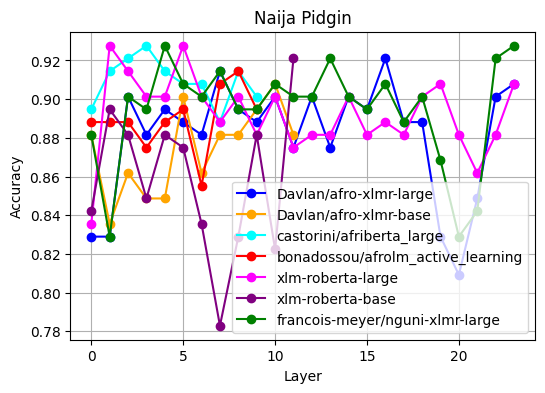

In [ ]:
write_results("pcm", test_results)
plot_results(test_results, "Naija Pidgin", "Accuracy")

### News topic classification for Igbo

In [ ]:
train, val, test = download_dataset('ibo')

Generating train split:   0%|          | 0/1356 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/194 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/390 [00:00<?, ? examples/s]

In [ ]:
test_results = train_models(checkpoints_dict=checkpoints_hidden_layer_sizes, train=train, val=val, test=test)

========================================Model: Davlan/afro-xlmr-large=================================================
Layer: 1/24
Epoch 1/200, Loss: 2.0006, Accuracy: 0.1423, Val Loss: 1.9934, Val Accuracy: 0.1872
Epoch 51/200, Loss: 1.4537, Accuracy: 0.5317, Val Loss: 1.5891, Val Accuracy: 0.4590
Epoch 101/200, Loss: 1.1617, Accuracy: 0.6652, Val Loss: 1.3955, Val Accuracy: 0.5487
Epoch 151/200, Loss: 0.9568, Accuracy: 0.7507, Val Loss: 1.2855, Val Accuracy: 0.5667
Epoch 170/200, Loss: 0.8839, Accuracy: 0.7647, Val Loss: 1.2443, Val Accuracy: 0.5821
Early stopping at epoch 170 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.5923076923076923

Layer: 2/24
Epoch 1/200, Loss: 2.0036, Accuracy: 0.1527, Val Loss: 2.0234, Val Accuracy: 0.1846
Epoch 51/200, Loss: 1.4179, Accuracy: 0.5671, Val Loss: 1.5449, Val Accuracy: 0.5000
Epoch 101/200, Loss: 1.1042, Accuracy: 0.6932, Val Loss: 1.3056, Val Accuracy: 0.5538
Epoch 150/200,

Some weights of XLMRobertaForTokenClassification were not initialized from the model checkpoint at castorini/afriberta_large and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


========================================Model: castorini/afriberta_large=================================================
Layer: 1/10
Epoch 1/200, Loss: 2.0849, Accuracy: 0.1187, Val Loss: 2.0053, Val Accuracy: 0.1462
Epoch 51/200, Loss: 1.1948, Accuracy: 0.6984, Val Loss: 1.1799, Val Accuracy: 0.7128
Epoch 101/200, Loss: 0.8945, Accuracy: 0.7780, Val Loss: 0.9300, Val Accuracy: 0.7462
Epoch 151/200, Loss: 0.7292, Accuracy: 0.8223, Val Loss: 0.8148, Val Accuracy: 0.7795
Training complete.
Best validation accuracy: 0.7897435897435897

Layer: 2/10
Epoch 1/200, Loss: 2.0227, Accuracy: 0.1372, Val Loss: 2.0782, Val Accuracy: 0.0385
Epoch 51/200, Loss: 1.0686, Accuracy: 0.7471, Val Loss: 1.1050, Val Accuracy: 0.7231
Epoch 101/200, Loss: 0.8093, Accuracy: 0.8119, Val Loss: 0.8657, Val Accuracy: 0.7923
Epoch 135/200, Loss: 0.6806, Accuracy: 0.8510, Val Loss: 0.7709, Val Accuracy: 0.8026
Early stopping at epoch 135 due to no improvement in validation loss for 10 consecutive epochs.
Training co

Some weights of XLMRobertaModel were not initialized from the model checkpoint at bonadossou/afrolm_active_learning and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


========================================Model: bonadossou/afrolm_active_learning=================================================
Layer: 1/10
Epoch 1/200, Loss: 1.9607, Accuracy: 0.1917, Val Loss: 1.9178, Val Accuracy: 0.1538
Epoch 51/200, Loss: 1.2960, Accuracy: 0.6187, Val Loss: 1.3715, Val Accuracy: 0.5615
Epoch 101/200, Loss: 1.0458, Accuracy: 0.7131, Val Loss: 1.2040, Val Accuracy: 0.6154
Epoch 151/200, Loss: 0.8894, Accuracy: 0.7500, Val Loss: 1.1043, Val Accuracy: 0.6282
Epoch 189/200, Loss: 0.7985, Accuracy: 0.7765, Val Loss: 1.0524, Val Accuracy: 0.6641
Early stopping at epoch 189 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.6692307692307692

Layer: 2/10
Epoch 1/200, Loss: 1.9984, Accuracy: 0.1519, Val Loss: 1.9425, Val Accuracy: 0.1436
Epoch 51/200, Loss: 1.3752, Accuracy: 0.5841, Val Loss: 1.4662, Val Accuracy: 0.5410
Epoch 101/200, Loss: 1.1104, Accuracy: 0.6881, Val Loss: 1.2563, Val Accuracy: 0.6128
Epo

### Write and plot results for Igbo

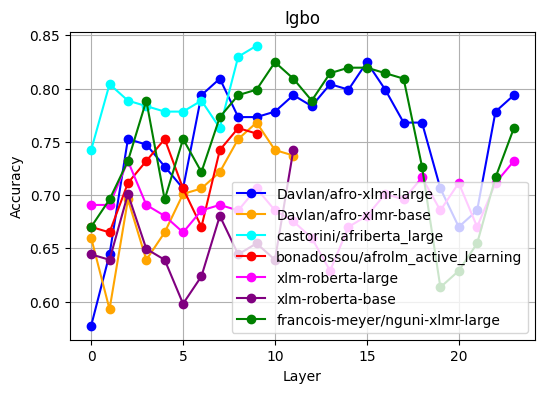

In [ ]:
write_results("ibo", test_results)
plot_results(test_results, "Igbo", "Accuracy")

In [ ]:
news_topic_classifier = NewsTopicProbe(1024, 7).to(device)
epochs, train_loss, train_accuracy, best_val_loss, val_accuracy, _ = train_probe_classifier1(news_topic_classifier, train_dataloader, val_dataloader, epochs = 200)

Epoch 1/200, Loss: 2.0730, Accuracy: 0.1463, Val Loss: 1.9162, Val Accuracy: 0.2721
Epoch 6/200, Loss: 1.8503, Accuracy: 0.2781, Val Loss: 1.7835, Val Accuracy: 0.3537
Epoch 11/200, Loss: 1.6870, Accuracy: 0.4273, Val Loss: 1.6411, Val Accuracy: 0.4626
Epoch 16/200, Loss: 1.5773, Accuracy: 0.5329, Val Loss: 1.5198, Val Accuracy: 0.6054
Epoch 21/200, Loss: 1.4564, Accuracy: 0.6172, Val Loss: 1.4568, Val Accuracy: 0.6599
Epoch 26/200, Loss: 1.3792, Accuracy: 0.6686, Val Loss: 1.3595, Val Accuracy: 0.7211
Epoch 31/200, Loss: 1.3178, Accuracy: 0.6986, Val Loss: 1.3101, Val Accuracy: 0.7347
Epoch 36/200, Loss: 1.2415, Accuracy: 0.7355, Val Loss: 1.2295, Val Accuracy: 0.7347
Epoch 41/200, Loss: 1.1848, Accuracy: 0.7636, Val Loss: 1.1823, Val Accuracy: 0.7415
Epoch 46/200, Loss: 1.1359, Accuracy: 0.7791, Val Loss: 1.1771, Val Accuracy: 0.7483
Epoch 51/200, Loss: 1.0798, Accuracy: 0.7984, Val Loss: 1.1173, Val Accuracy: 0.7415
Epoch 56/200, Loss: 1.0450, Accuracy: 0.8101, Val Loss: 1.0862, Val

## BiLSTM Baseline

In [ ]:
# import torch
# import torch.nn as nn

# class UntrainedBiLSTM(nn.Module):
#     def __init__(self, input_dim, hidden_dim, embedding_dim, vocab_size, num_layers=1, bidirectional=True):
#         super(UntrainedBiLSTM, self).__init__()
#         self.hidden_dim = hidden_dim
#         self.num_layers = num_layers
#         self.bidirectional = bidirectional


#         self.word_embeddings = nn.Embedding(vocab_size, embedding_dim)
#         self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers, bidirectional=bidirectional, batch_first=True)


#     def forward(self, x):
#         embeddings = self.word_embeddings(x)

#         lstm_out, _ = self.lstm(embeddings)

#         # Get the output from the last time step
#         # lstm_out = lstm_out[:, -1, :]  # Take last hidden state for each sequence

#         # Fully connected layer
#         # out = self.fc(lstm_out)

#         return lstm_out

import torch
import torch.nn as nn

class UntrainedBiLSTM(nn.Module):
    def __init__(self, char_vocab_size, char_embed_dim, word_embed_dim, hidden_dim, num_layers=1, bidirectional=True):
        super(UntrainedBiLSTM, self).__init__()
        self.char_embedding = nn.Embedding(char_vocab_size, char_embed_dim)

        # 1D CNN to generate word embeddings from character embeddings
        self.char_cnn = nn.Conv1d(in_channels=char_embed_dim, out_channels=word_embed_dim, kernel_size=3, padding=1)

        self.lstm = nn.LSTM(word_embed_dim, hidden_dim, num_layers,
                            bidirectional=bidirectional, batch_first=True)

    def forward(self, x):
        import torch
import torch.nn as nn

class UntrainedBiLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim, embedding_dim, vocab_size,
                 num_layers=1, bidirectional=True):
        super(UntrainedBiLSTM, self).__init__()
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers
        self.bidirectional = bidirectional

        # Embedding layer for characters
        self.char_embeddings = nn.Embedding(vocab_size, embedding_dim)

        # BiLSTM for processing the embedded characters
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers,
                            bidirectional=bidirectional, batch_first=True)

    def forward(self, x):
        """
        Forward pass through the BiLSTM.
        x: Tensor of shape (batch_size, seq_len, char_embed_dim)
        """
        # Handle cases where the input might be without a batch dimension
        if x.dim() == 2:  # If input is (seq_len, char_embed_dim)
            x = x.unsqueeze(0)  # Add batch dimension: (1, seq_len, char_embed_dim)

        # Get embeddings from the character input (if not already pre-embedded)
        embeddings = self.char_embeddings(x)  # Shape: (batch_size, seq_len, embedding_dim)

        # Pass through BiLSTM
        lstm_out, _ = self.lstm(embeddings)  # Shape: (batch_size, seq_len, 2 * hidden_dim)

        # Remove batch dimension if necessary
        if lstm_out.size(0) == 1:
            lstm_out = lstm_out.squeeze(0)  # Shape: (seq_len, 2 * hidden_dim)

        return lstm_out  # Return processed output

### Create a vocabulary for the dataset
This will allow us to assign unique ids to each word.

In [ ]:
def news_topic_vocabulary(datasets: list) -> dict:
    vocab = {}
    for dataset in datasets:
      for sample in dataset:
          text = sample['text']
          words = text.split()
          for word in words:
              if word not in vocab:
                  vocab[word] = len(vocab)
    return vocab


def build_char_vocab(datasets: list) -> dict:
    char_vocab = {}
    for dataset in datasets:
        for sample in dataset:
            text = sample['text']
            for word in text.split():
                for char in word:
                    if char not in char_vocab:
                        char_vocab[char] = len(char_vocab)
    return char_vocab


### Assign each word in a sequence a unique id

In [ ]:
def sequence_to_input_ids(seq:list, to_ix: dict):
    idxs = [to_ix[w] for w in seq]
    return torch.tensor(idxs, dtype=torch.long)

def word_to_char_ids(word: str, char_vocab: dict, max_word_len: int) -> torch.tensor:
    """Converts a word to a tensor of character IDs with padding."""
    char_ids = [char_vocab.get(c, 0) for c in word]  # Use 0 for unknown chars
    # Pad or truncate to max_word_len
    char_ids = char_ids[:max_word_len] + [0] * (max_word_len - len(char_ids))
    return torch.tensor(char_ids, dtype=torch.long)

def sequence_to_char_ids(seq: list, char_vocab: dict, max_word_len: int) -> torch.tensor:
    """Converts a list of words into a tensor of character IDs."""
    return torch.stack([word_to_char_ids(word, char_vocab, max_word_len) for word in seq])


### Using pooling to aggregrate the hidden embeddings
I'm using mean pooling to pool the hidden vector representations for the BiLSTM.

In [ ]:
import datasets
# def get_pooled_embeddings(dataset: datasets.arrow_dataset.Dataset, vocab: dict, hidden_dim: int, embedding_dim: int)->list:
#     vocab_size = len(vocab)
#     biLSTM = UntrainedBiLSTM(embedding_dim, hidden_dim, embedding_dim, vocab_size)
#     embeddings = []
#     labels = []
#     num_samples = len(dataset)

#     for sample in dataset:
#         input = sequence_to_input_ids(sample['text'].split(), vocab)
#         #input = input.unsqueeze(0)
#         output = biLSTM(input)
#         pooled_output = torch.mean(output, axis=0)
#         # print(pooled_output.shape)
#         embeddings.append(pooled_output.tolist())
#         labels.append(sample['label'])

#     return embeddings, labels

# def get_pooled_embeddings(dataset, char_vocab, hidden_dim, word_embed_dim, max_word_len):
#     biLSTM = UntrainedBiLSTM(len(char_vocab), 10, word_embed_dim, hidden_dim)

#     embeddings = []
#     labels = []

#     for sample in dataset:
#         words = sample['text'].split()
#         input_char_ids = torch.stack([sequence_to_char_ids(words, char_vocab, max_word_len)])
#         #input_char_ids = input_char_ids.unsqueeze(0)

#         # Forward pass through BiLSTM
#         output = biLSTM(input_char_ids)  # [batch_size, seq_len, hidden_dim * num_directions]

#         # Mean-pool the LSTM outputs over the sequence length
#         pooled_output = torch.mean(output, axis=0)  # [batch_size, hidden_dim * num_directions]

#         embeddings.append(pooled_output.tolist())
#         labels.append(sample['label'])

#     return embeddings, labels


def get_pooled_embeddings(dataset, char_vocab, hidden_dim, word_embed_dim, max_word_len):
    char_embed_dim = word_embed_dim  # Character embedding dimension
    vocab_size = len(char_vocab)

    biLSTM = UntrainedBiLSTM(char_embed_dim, hidden_dim, char_embed_dim, vocab_size)
    embeddings = []
    labels = []

    for sample in dataset:
        text = sample['text']
        label = sample['label']

        # Convert words to character-level input (seq_len, word_len)
        input_char_ids = [
            [char_vocab.get(char, char_vocab['<UNK>']) for char in word]
            for word in text.split()
        ]

        # Convert to tensor (seq_len, word_len)
        input_char_ids = torch.tensor(input_char_ids, dtype=torch.long)

        # Reshape input to (seq_len * word_len, char_embed_dim)
        flattened_input = input_char_ids.view(-1, input_char_ids.size(-1))

        # Add batch dimension: (1, seq_len * word_len, char_embed_dim)
        flattened_input = flattened_input.unsqueeze(0)

        # Forward pass through the BiLSTM
        output = biLSTM(flattened_input)  # Shape: (1, total_seq_len, 2 * hidden_dim)

        # Mean pool over sequence dimension
        pooled_output = torch.mean(output, dim=1)  # Shape: (1, 2 * hidden_dim)
        embeddings.append(pooled_output.squeeze(0).tolist())
        labels.append(label)

    return embeddings, labels

### Swahili

In [ ]:
train, val, test = download_dataset("swa")

In [ ]:
vocab = news_topic_vocabulary([train, val, test])

### Create sentence-level PyTorch datasets for the BiLSTM embeddings

In [ ]:
# hidden_dim = 512
# embedding_dim = 512
# train_biLSTM_embeddings, train_biLSTM_labels = get_pooled_embeddings(train, vocab, hidden_dim, embedding_dim)

# val_biLSTM_embeddings, val_biLSTM_labels = get_pooled_embeddings(val, vocab, hidden_dim, embedding_dim)

# test_biLSTM_embeddings, test_biLSTM_labels = get_pooled_embeddings(test, vocab, hidden_dim, embedding_dim)

# Build character-level vocabulary
char_vocab = build_char_vocab([train, val, test])

# Set hyperparameters
max_word_len = max(len(word) for dataset in [train, val, test] for sample in dataset for word in sample['text'].split())
word_embed_dim = 64
hidden_dim = 64

# Get embeddings and labels for each dataset
train_embeddings, train_labels = get_pooled_embeddings(train, char_vocab, hidden_dim, word_embed_dim, max_word_len)
val_embeddings, val_labels = get_pooled_embeddings(val, char_vocab, hidden_dim, word_embed_dim, max_word_len)
test_embeddings, test_labels = get_pooled_embeddings(test, char_vocab, hidden_dim, word_embed_dim, max_word_len)


### Create dataloaders for the embeddings datasets.

In [ ]:
biLSTM_embeddings_dataset = NewsTopicDataset(train_embeddings, train_labels)
train_biLSTM_dataloader = DataLoader(biLSTM_embeddings_dataset, batch_size=32, shuffle=True)

val_biLSTM_embeddings_dataset = NewsTopicDataset(val_embeddings, val_labels)
val_biLSTM_dataloader = DataLoader(val_biLSTM_embeddings_dataset, batch_size=32, shuffle=False)

test_biLSTM_embeddings_dataset = NewsTopicDataset(test_embeddings, test_labels)
test_biLSTM_dataloader = DataLoader(test_biLSTM_embeddings_dataset, batch_size=32, shuffle=False)

### Plot the distribution of labels in the test set
As shown in the plot, there are no labels for Religion. It's the same for the train and validation sets.

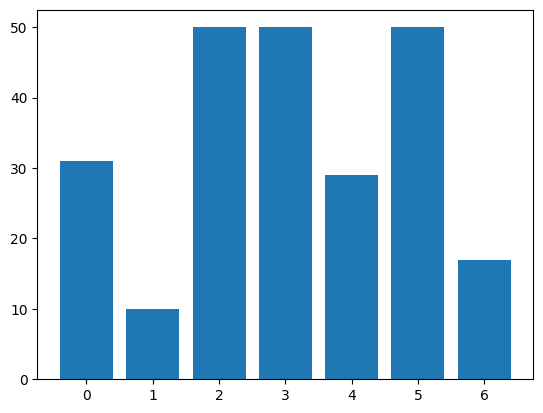

In [ ]:
unique_test, counts = np.unique(test_biLSTM_labels, return_counts=True)
plt.bar(unique_test, counts)
plt.xticks(unique_test)
# plt.legend()
plt.show()

### Create a probe classifier model and train

In [ ]:
news_topic_classifier = NewsTopicProbe(128, 7).to(device)
epochs, train_loss, train_accuracy, best_val_loss, val_accuracy, _ = train_probe_classifier1(news_topic_classifier, train_biLSTM_dataloader, val_biLSTM_dataloader, epochs = 200)

### Hausa

In [ ]:
train, val, test = download_dataset("hau")
vocab = news_topic_vocabulary([train, val, test])

In [ ]:
hidden_dim = 512
embedding_dim = 512
train_biLSTM_embeddings, train_biLSTM_labels = get_pooled_embeddings(train, vocab, hidden_dim, embedding_dim)

val_biLSTM_embeddings, val_biLSTM_labels = get_pooled_embeddings(val, vocab, hidden_dim, embedding_dim)

test_biLSTM_embeddings, test_biLSTM_labels = get_pooled_embeddings(test, vocab, hidden_dim, embedding_dim)

In [ ]:
biLSTM_embeddings_dataset = NewsTopicDataset(train_biLSTM_embeddings, train_biLSTM_labels)
train_biLSTM_dataloader = DataLoader(biLSTM_embeddings_dataset, batch_size=32, shuffle=True)

val_biLSTM_embeddings_dataset = NewsTopicDataset(val_biLSTM_embeddings, val_biLSTM_labels)
val_biLSTM_dataloader = DataLoader(val_biLSTM_embeddings_dataset, batch_size=32, shuffle=False)

test_biLSTM_embeddings_dataset = NewsTopicDataset(test_biLSTM_embeddings, test_biLSTM_labels)
test_biLSTM_dataloader = DataLoader(test_biLSTM_embeddings_dataset, batch_size=32, shuffle=False)

In [ ]:
news_topic_classifier = NewsTopicProbe(1024, 7).to(device)
epochs, train_loss, train_accuracy, best_val_loss, val_accuracy, _ = train_probe_classifier1(news_topic_classifier, train_biLSTM_dataloader, val_biLSTM_dataloader, epochs = 200)

Epoch 1/200, Loss: 1.9960, Accuracy: 0.1676, Val Loss: 1.9767, Val Accuracy: 0.1162
Epoch 11/200, Loss: 1.6047, Accuracy: 0.4529, Val Loss: 2.0383, Val Accuracy: 0.1240
Early stopping at epoch 11 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.13343799058084774


### Naija Pidgin

In [ ]:
train, val, test = download_dataset("pcm")
vocab = news_topic_vocabulary([train, val, test])

In [ ]:
hidden_dim = 512
embedding_dim = 512
train_biLSTM_embeddings, train_biLSTM_labels = get_pooled_embeddings(train, vocab, hidden_dim, embedding_dim)

val_biLSTM_embeddings, val_biLSTM_labels = get_pooled_embeddings(val, vocab, hidden_dim, embedding_dim)

test_biLSTM_embeddings, test_biLSTM_labels = get_pooled_embeddings(test, vocab, hidden_dim, embedding_dim)

In [ ]:
biLSTM_embeddings_dataset = NewsTopicDataset(train_biLSTM_embeddings, train_biLSTM_labels)
train_biLSTM_dataloader = DataLoader(biLSTM_embeddings_dataset, batch_size=32, shuffle=True)

val_biLSTM_embeddings_dataset = NewsTopicDataset(val_biLSTM_embeddings, val_biLSTM_labels)
val_biLSTM_dataloader = DataLoader(val_biLSTM_embeddings_dataset, batch_size=32, shuffle=False)

test_biLSTM_embeddings_dataset = NewsTopicDataset(test_biLSTM_embeddings, test_biLSTM_labels)
test_biLSTM_dataloader = DataLoader(test_biLSTM_embeddings_dataset, batch_size=32, shuffle=False)

In [ ]:
news_topic_classifier = NewsTopicProbe(1024, 7).to(device)
epochs, train_loss, train_accuracy, best_val_loss, val_accuracy, _ = train_probe_classifier1(news_topic_classifier, train_biLSTM_dataloader, val_biLSTM_dataloader, epochs = 200)

Epoch 1/200, Loss: 2.0434, Accuracy: 0.1321, Val Loss: 1.9436, Val Accuracy: 0.0656
Epoch 51/200, Loss: 1.2229, Accuracy: 0.7123, Val Loss: 1.7116, Val Accuracy: 0.3279
Epoch 76/200, Loss: 1.0237, Accuracy: 0.7821, Val Loss: 1.6717, Val Accuracy: 0.3311
Early stopping at epoch 76 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.3475409836065574


### Luganda

In [ ]:
train, val, test = download_dataset("lug")
vocab = news_topic_vocabulary([train, val, test])

In [ ]:
hidden_dim = 512
embedding_dim = 512
train_biLSTM_embeddings, train_biLSTM_labels = get_pooled_embeddings(train, vocab, hidden_dim, embedding_dim)

val_biLSTM_embeddings, val_biLSTM_labels = get_pooled_embeddings(val, vocab, hidden_dim, embedding_dim)

test_biLSTM_embeddings, test_biLSTM_labels = get_pooled_embeddings(test, vocab, hidden_dim, embedding_dim)

In [ ]:
biLSTM_embeddings_dataset = NewsTopicDataset(train_biLSTM_embeddings, train_biLSTM_labels)
train_biLSTM_dataloader = DataLoader(biLSTM_embeddings_dataset, batch_size=32, shuffle=True)

val_biLSTM_embeddings_dataset = NewsTopicDataset(val_biLSTM_embeddings, val_biLSTM_labels)
val_biLSTM_dataloader = DataLoader(val_biLSTM_embeddings_dataset, batch_size=32, shuffle=False)

test_biLSTM_embeddings_dataset = NewsTopicDataset(test_biLSTM_embeddings, test_biLSTM_labels)
test_biLSTM_dataloader = DataLoader(test_biLSTM_embeddings_dataset, batch_size=32, shuffle=False)

In [ ]:
news_topic_classifier = NewsTopicProbe(1024, 7).to(device)
epochs, train_loss, train_accuracy, best_val_loss, val_accuracy, _ = train_probe_classifier1(news_topic_classifier, train_biLSTM_dataloader, val_biLSTM_dataloader, epochs = 200)

Epoch 1/200, Loss: 1.9679, Accuracy: 0.1699, Val Loss: 1.9463, Val Accuracy: 0.0852
Epoch 11/200, Loss: 1.8015, Accuracy: 0.3333, Val Loss: 2.3831, Val Accuracy: 0.1614
Early stopping at epoch 11 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.17040358744394618


### Igbo

In [ ]:
train, val, test = download_dataset("ibo")
vocab = news_topic_vocabulary([train, val, test])

In [ ]:
hidden_dim = 512
embedding_dim = 512
train_biLSTM_embeddings, train_biLSTM_labels = get_pooled_embeddings(train, vocab, hidden_dim, embedding_dim)

val_biLSTM_embeddings, val_biLSTM_labels = get_pooled_embeddings(val, vocab, hidden_dim, embedding_dim)

test_biLSTM_embeddings, test_biLSTM_labels = get_pooled_embeddings(test, vocab, hidden_dim, embedding_dim)

In [ ]:
biLSTM_embeddings_dataset = NewsTopicDataset(train_biLSTM_embeddings, train_biLSTM_labels)
train_biLSTM_dataloader = DataLoader(biLSTM_embeddings_dataset, batch_size=32, shuffle=True)

val_biLSTM_embeddings_dataset = NewsTopicDataset(val_biLSTM_embeddings, val_biLSTM_labels)
val_biLSTM_dataloader = DataLoader(val_biLSTM_embeddings_dataset, batch_size=32, shuffle=False)

test_biLSTM_embeddings_dataset = NewsTopicDataset(test_biLSTM_embeddings, test_biLSTM_labels)
test_biLSTM_dataloader = DataLoader(test_biLSTM_embeddings_dataset, batch_size=32, shuffle=False)

In [ ]:
news_topic_classifier = NewsTopicProbe(1024, 7).to(device)
epochs, train_loss, train_accuracy, best_val_loss, val_accuracy, _ = train_probe_classifier1(news_topic_classifier, train_biLSTM_dataloader, val_biLSTM_dataloader, epochs = 200)

Epoch 1/200, Loss: 2.0270, Accuracy: 0.1482, Val Loss: 1.9396, Val Accuracy: 0.1436
Epoch 19/200, Loss: 1.6304, Accuracy: 0.4535, Val Loss: 1.9053, Val Accuracy: 0.1564
Early stopping at epoch 19 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.17435897435897435


### isiXhosa

In [ ]:
train, val, test = download_dataset("xho")
vocab = news_topic_vocabulary([train, val, test])

In [ ]:
hidden_dim = 512
embedding_dim = 512
train_biLSTM_embeddings, train_biLSTM_labels = get_pooled_embeddings(train, vocab, hidden_dim, embedding_dim)

val_biLSTM_embeddings, val_biLSTM_labels = get_pooled_embeddings(val, vocab, hidden_dim, embedding_dim)

test_biLSTM_embeddings, test_biLSTM_labels = get_pooled_embeddings(test, vocab, hidden_dim, embedding_dim)

In [ ]:
biLSTM_embeddings_dataset = NewsTopicDataset(train_biLSTM_embeddings, train_biLSTM_labels)
train_biLSTM_dataloader = DataLoader(biLSTM_embeddings_dataset, batch_size=32, shuffle=True)

val_biLSTM_embeddings_dataset = NewsTopicDataset(val_biLSTM_embeddings, val_biLSTM_labels)
val_biLSTM_dataloader = DataLoader(val_biLSTM_embeddings_dataset, batch_size=32, shuffle=False)

test_biLSTM_embeddings_dataset = NewsTopicDataset(test_biLSTM_embeddings, test_biLSTM_labels)
test_biLSTM_dataloader = DataLoader(test_biLSTM_embeddings_dataset, batch_size=32, shuffle=False)

In [ ]:
news_topic_classifier = NewsTopicProbe(1024, 7).to(device)
epochs, train_loss, train_accuracy, best_val_loss, val_accuracy, _ = train_probe_classifier1(news_topic_classifier, train_biLSTM_dataloader, val_biLSTM_dataloader, epochs = 200)

Epoch 1/200, Loss: 1.9423, Accuracy: 0.1831, Val Loss: 1.9628, Val Accuracy: 0.0101
Epoch 35/200, Loss: 1.3781, Accuracy: 0.6618, Val Loss: 1.7724, Val Accuracy: 0.3266
Early stopping at epoch 35 due to no improvement in validation loss for 10 consecutive epochs.
Training complete.
Best validation accuracy: 0.3265993265993266
